# 导入必要的库

In [1]:
import os 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matlab.engine
import time
import scipy.io
import pandas as pd
import pickle
import scipy
import warnings
import torch
from accProcess import *
sns.set_style('ticks')
sns.set_context("poster")
plt.rcParams['font.sans-serif'] = 'Arial'
warnings.filterwarnings("ignore")
# matlabeng = matlab.engine.start_matlab()   #启动matlab

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

# 指定模型和网络，加载数据

In [72]:
model_path = 'inp_arg3_model_events'
result_path = 'basic_3inps_100events_fts0'
figure_path = 'result_figs'
fig_fmt = 'png'
if not os.path.exists(os.path.join(model_path, result_path, figure_path)):
    os.mkdir(os.path.join(model_path, result_path, figure_path))
with open(os.path.join(model_path, 'data_preprocess_100events_logFTS0.pkl'), 'rb') as file:
    dataset = pickle.loads(file.read())
results = scipy.io.loadmat(os.path.join(model_path, result_path, 'result.mat'))
print(results.keys())
freq = np.logspace(np.log10(0.1), np.log10(25), 500)

dict_keys(['__header__', '__version__', '__globals__', 'train_pred', 'test_pred', 'valid_pred', 'train_loss', 'valid_loss', 'train_performance', 'valid_performance', 'test_performance'])


# Test数据集全部台站结果与模拟结果对比可视化

## 指定测试集，获取这些台站的数据，并计算残差

In [73]:
# 获取数据
freq_hz = [0.5, 1.0, 2.0, 5.0, 10.0, 15.0]
event_msg = np.load('event_msg.npy', allow_pickle=True).item()
vs30_data = np.load('vs30.npy', allow_pickle=True).item()
source_data = np.load('source.npy', allow_pickle=True).item()
simu_data = np.load('FTS_simulate.npy', allow_pickle=True).item()
label, pred, simu = [], [], []
PGA, vs30, source= [], [], []
event_simu = list(simu_data.keys())

pbar = tqdm(range(dataset.test_label.shape[0]), desc='Processing', ncols=100)
for i in pbar:
    event = dataset.test_events[dataset.test_idx[i]]
    pbar.set_description(event)
    if event in event_simu:
        label.append(dataset.test_label[i, ...])
        pred.append(results['test_pred'][i, ...])
        simu.append(981 * simu_data[event][..., None])
        PGA.append(981 * np.sqrt(event_msg[event][13] * event_msg[event][39]))
        vs30.append(vs30_data[event[:6]])
        source.append(source_data[event].ravel())

label, pred, simu = np.array(label), np.array(pred), np.array(simu)
label = label * dataset.label_std + dataset.label_mean
simu = np.log10(simu)
PGA, vs30, source = np.array(PGA), np.array(vs30), np.array(source)


# 计算残差
residual_pred = np.log(10) * (pred - label)
residual_simu = np.log(10) * (simu - label)

YMTH071611240623: 100%|████████████████████████████████████████| 2660/2660 [00:05<00:00, 444.24it/s]


## 不同频率下预测和实际对比图

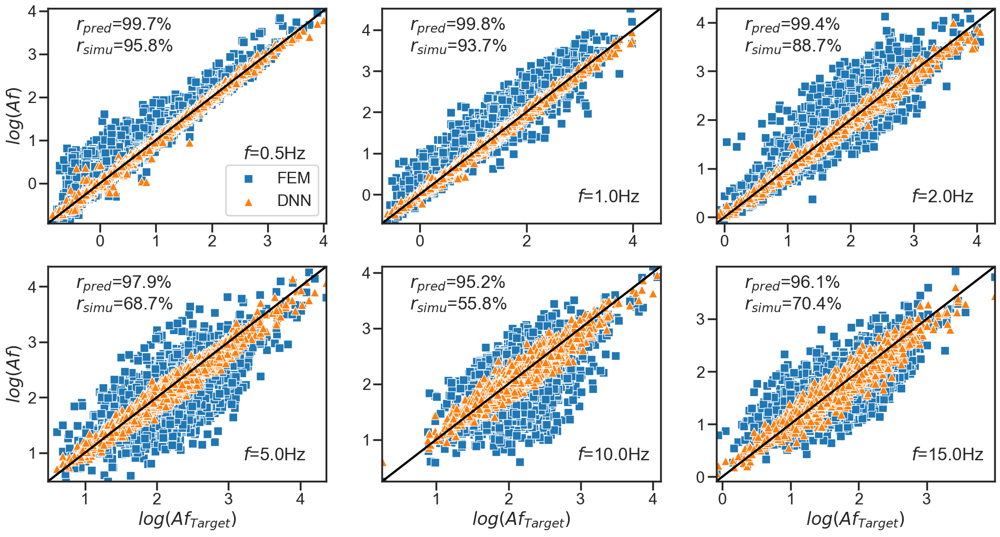

In [102]:
plt.figure(figsize=(18, 9))
plt.subplots_adjust(left=0,bottom=0,top=1,right=1,hspace=0.2,wspace=0.2)
for i, f in enumerate(freq_hz):
    idx = np.argmin(np.abs(freq - f))
    label_points = label[:, idx, 0]
    pred_points = pred[:, idx, 0]
    simu_points = simu[:, idx, 0]
    r_pred = np.corrcoef(label_points, pred_points)[0, 1]
    r_simu = np.corrcoef(label_points, simu_points)[0, 1]
    xmin = np.min([np.min(label_points), np.min(pred_points), np.min(simu_points)])
    xmax = np.max([np.max(label_points), np.max(pred_points), np.max(simu_points)])
    plt.subplot(2, 3, i + 1)
    sns.scatterplot(x=label_points, y=simu_points, label='FEM', marker='s', color=colors[0])
    sns.scatterplot(x=label_points, y=pred_points, label='DNN', marker='^', color=colors[1])
    plt.plot([xmin, xmax], [xmin, xmax], 'k', linewidth=3)
    plt.text(0.9 * xmin + 0.1 * xmax, 0.1 * xmin + 0.9 * xmax, '$r_{pred}$=%.1f%%' % (100 * r_pred), size=24)
    plt.text(0.9 * xmin + 0.1 * xmax, 0.2 * xmin + 0.8 * xmax, '$r_{simu}$=%.1f%%' % (100 * r_simu), size=24)
    plt.xlim([xmin, xmax])
    plt.ylim([xmin, xmax])
    if i >= 3:
        plt.xlabel('$log(Af_{Target})$')
    if i in [0, 3]:
        plt.ylabel('$log(Af)$')
    # plt.xscale('log')
    # plt.yscale('log')
    if i == 0:
        plt.legend(loc='lower right')
        plt.text(0.3 * xmin + 0.7 * xmax, 0.7 * xmin + 0.3 * xmax, '$f$=%.1fHz' % f, size=24)
    else:
        plt.gca().get_legend().remove()
        plt.text(0.3 * xmin + 0.7 * xmax, 0.9 * xmin + 0.1 * xmax, '$f$=%.1fHz' % f, size=24)
plt.savefig(os.path.join(model_path, result_path, figure_path, 'Af_f_compare.%s' % fig_fmt), dpi=300, bbox_inches='tight')

## 绘制残差分布图

### 残差随频率的分布图

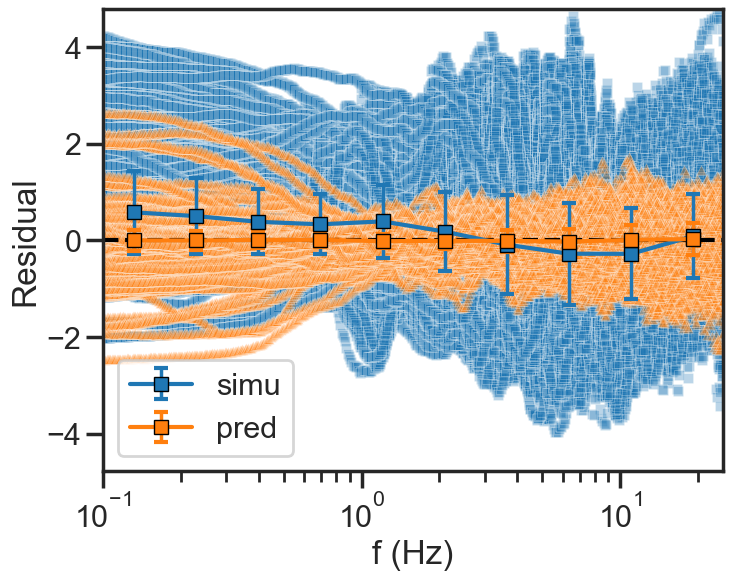

In [75]:
N = len(freq)
num_bar = 10
f_err, mean_err_pred, std_err_pred, mean_err_simu, std_err_simu = np.zeros(num_bar), np.zeros(num_bar), np.zeros(num_bar), np.zeros(num_bar), np.zeros(num_bar)
for i in range(num_bar):
    f_err[i] = freq[int((i + 0.5) * N / num_bar)]
    mean_err_pred[i] = np.mean(residual_pred[:, int(i * N / num_bar) : int((i + 1) * N / num_bar), 0])
    std_err_pred[i] = np.std(residual_pred[:, int(i * N / num_bar) : int((i + 1) * N / num_bar), 0])
    mean_err_simu[i] = np.mean(residual_simu[:, int(i * N / num_bar) : int((i + 1) * N / num_bar), 0])
    std_err_simu[i] = np.std(residual_simu[:, int(i * N / num_bar) : int((i + 1) * N / num_bar), 0])

ylim = np.max([np.max(np.abs(residual_pred)), np.max(np.abs(residual_simu))])
plt.figure(figsize=(8, 6))
plt.plot([np.min(freq), np.max(freq)], [0, 0], 'k--')
sns.scatterplot(x=np.tile(freq, residual_simu.shape[0]), y=residual_simu[..., 0].ravel(), s=50, color=colors[0], marker='s', alpha=0.3)
plt.errorbar(f_err, mean_err_simu, std_err_simu, fmt='s-', ecolor=colors[0], ms=10, mfc=colors[0], mec='k', color=colors[0], elinewidth=2.5, capsize=5, capthick=3, label='simu')
sns.scatterplot(x=np.tile(freq, residual_pred.shape[0]), y=residual_pred[..., 0].ravel(), s=50, color=colors[1], marker='^', alpha=0.3)
plt.errorbar(f_err, mean_err_pred, std_err_pred, fmt='s-', ecolor=colors[1], ms=10, mfc=colors[1], mec='k', color=colors[1], elinewidth=2.5, capsize=5, capthick=3, label='pred')
plt.xlim([np.min(freq), np.max(freq)])
plt.ylim([-ylim, ylim])
plt.xscale('log')
plt.xlabel('f (Hz)')
plt.ylabel('Residual')
plt.legend()
plt.savefig(os.path.join(model_path, result_path, figure_path, 'residual_freq.%s' % fig_fmt), dpi=300, bbox_inches='tight')

### 残差随地表PGA的分布图

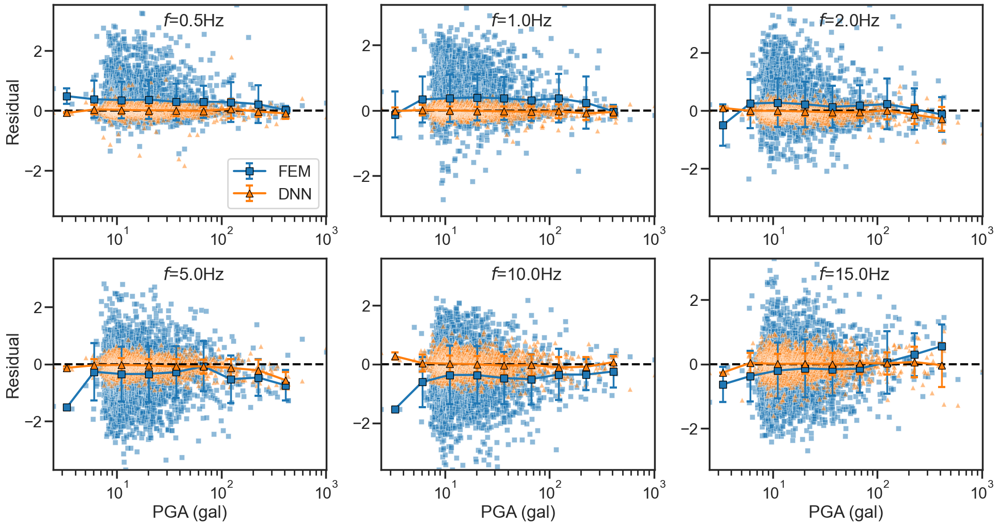

In [104]:
value_list = PGA

# 将所有地震的PGA按从小到大的顺序划分为10组，以便后面求解误差棒
value_min = np.min(value_list)
value_max = np.max(value_list)
num_bar = 10
value_step = (np.log(value_max) - np.log(value_min)) / num_bar
sort_idx = np.argsort(value_list)
value_list = value_list[sort_idx]
N = len(value_list)
idx_err = []
value_err = np.exp((np.arange(num_bar) + 0.5) * value_step + np.log(value_min))
for i in range(num_bar):
    idx = []
    for j, value in enumerate(value_list):
        if np.log(value) >= np.log(value_min) + i * value_step and np.log(value) < np.log(value_min) + (i + 1) * value_step:
            idx.append(j)
    idx_err.append(idx)

# 绘制残差随PGA的分布图和分组误差棒
plt.figure(figsize=(18, 9))
plt.subplots_adjust(left=0,bottom=0,top=1,right=1,hspace=0.2,wspace=0.2)
for i, f in enumerate(freq_hz):
    idx = np.argmin(np.abs(freq - f))
    residual_points_pred = residual_pred[:, idx, 0]
    residual_points_pred = residual_points_pred[sort_idx]
    residual_points_simu = residual_simu[:, idx, 0]
    residual_points_simu = residual_points_simu[sort_idx]
    ylim = np.max([np.max(np.abs(residual_points_pred)), np.max(np.abs(residual_points_simu))])

    mean_err_pred, std_err_pred, mean_err_simu, std_err_simu = np.zeros(num_bar), np.zeros(num_bar), np.zeros(num_bar), np.zeros(num_bar)
    for j in range(num_bar):
        mean_err_pred[j] = np.mean(residual_points_pred[idx_err[j]])
        std_err_pred[j] = np.std(residual_points_pred[idx_err[j]])
        mean_err_simu[j] = np.mean(residual_points_simu[idx_err[j]])
        std_err_simu[j] = np.std(residual_points_simu[idx_err[j]])

    plt.subplot(2, 3, i + 1)
    plt.plot([value_min, value_max], [0, 0], 'k--')
    sns.scatterplot(x=value_list, y=residual_points_simu, s=50, color=colors[0], marker='s', alpha=0.5)
    plt.errorbar(value_err[:-1], mean_err_simu[:-1], std_err_simu[:-1], fmt='s-', ecolor=colors[0], ms=10, mfc=colors[0], mec='k', color=colors[0], elinewidth=2.5, capsize=5, capthick=3, label='FEM')

    sns.scatterplot(x=value_list, y=residual_points_pred, s=50, color=colors[1], marker='^', alpha=0.5)
    plt.errorbar(value_err[:-1], mean_err_pred[:-1], std_err_pred[:-1], fmt='^-', ecolor=colors[1], ms=10, mfc=colors[1], mec='k', color=colors[1], elinewidth=2.5, capsize=5, capthick=3, label='DNN')
    plt.xlim([value_min, value_max])
    plt.ylim([-ylim, ylim])
    if i >= 3:
        plt.xlabel('PGA (gal)')
    if i in [0, 3]:
        plt.ylabel('Residual')
    if i == 0:
        plt.legend(loc='lower right')
    else:
        plt.gca().get_legend().remove()
    plt.xscale('log')
    plt.text(value_min ** 0.6 * value_max ** 0.4, 0.8 * ylim, '$f$=%.1fHz' % f, size=24)
plt.savefig(os.path.join(model_path, result_path, figure_path, 'residual_PGA.%s' % fig_fmt), dpi=300, bbox_inches='tight')

### 残差随$v_{s30}$的分布图

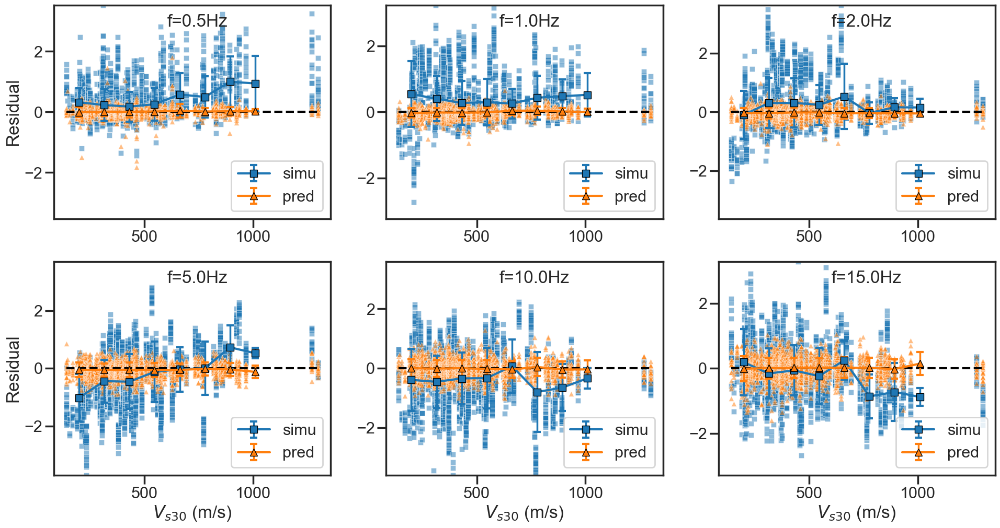

In [78]:
value_list = vs30

# 将所有地震对应的Vs30按从小到大的顺序划分为10组，以便后面求解误差棒
value_min = np.min(value_list)
value_max = np.max(value_list)
num_bar = 10
value_step = (value_max - value_min) / num_bar
sort_idx = np.argsort(value_list)
value_list = value_list[sort_idx]
N = len(value_list)
idx_err = []
value_err = value_min + (np.arange(num_bar) + 0.5) * value_step
for i in range(num_bar):
    idx = []
    for j, value in enumerate(value_list):
        if value >= value_min + i * value_step and value < value_min + (i + 1) * value_step:
            idx.append(j)
    idx_err.append(idx)

# 绘制残差随Vs30的分布图和分组误差棒
plt.figure(figsize=(18, 9))
plt.subplots_adjust(left=0,bottom=0,top=1,right=1,hspace=0.2,wspace=0.2)
for i, f in enumerate(freq_hz):
    idx = np.argmin(np.abs(freq - f))
    residual_points_pred = residual_pred[:, idx, 0]
    residual_points_pred = residual_points_pred[sort_idx]
    residual_points_simu = residual_simu[:, idx, 0]
    residual_points_simu = residual_points_simu[sort_idx]
    ylim = np.max([np.max(np.abs(residual_points_pred)), np.max(np.abs(residual_points_simu))])

    mean_err_pred, std_err_pred, mean_err_simu, std_err_simu = np.zeros(num_bar), np.zeros(num_bar), np.zeros(num_bar), np.zeros(num_bar)
    for j in range(num_bar):
        mean_err_pred[j] = np.mean(residual_points_pred[idx_err[j]])
        std_err_pred[j] = np.std(residual_points_pred[idx_err[j]])
        mean_err_simu[j] = np.mean(residual_points_simu[idx_err[j]])
        std_err_simu[j] = np.std(residual_points_simu[idx_err[j]])

    plt.subplot(2, 3, i + 1)
    plt.plot([value_min, value_max], [0, 0], 'k--')
    sns.scatterplot(x=value_list, y=residual_points_simu, s=50, color=colors[0], marker='s', alpha=0.5)
    plt.errorbar(value_err[:-1], mean_err_simu[:-1], std_err_simu[:-1], fmt='s-', ecolor=colors[0], ms=10, mfc=colors[0], mec='k', color=colors[0], elinewidth=2.5, capsize=5, capthick=3, label='simu')

    sns.scatterplot(x=value_list, y=residual_points_pred, s=50, color=colors[1], marker='^', alpha=0.5)
    plt.errorbar(value_err[:-1], mean_err_pred[:-1], std_err_pred[:-1], fmt='^-', ecolor=colors[1], ms=10, mfc=colors[1], mec='k', color=colors[1], elinewidth=2.5, capsize=5, capthick=3, label='pred')
    # plt.xlim([value_min, value_max])
    plt.ylim([-ylim, ylim])
    if i >= 3:
        plt.xlabel('$V_{s30}$ (m/s)')
    if i in [0, 3]:
        plt.ylabel('Residual')
    plt.legend(loc='lower right')
    plt.text(0.6 * value_min + 0.4 * value_max, 0.8 * ylim, 'f=%.1fHz' % f, size=24)
plt.savefig(os.path.join(model_path, result_path, figure_path, 'residual_vs30.%s' % fig_fmt), dpi=300, bbox_inches='tight')

### 残差随震级的分布图

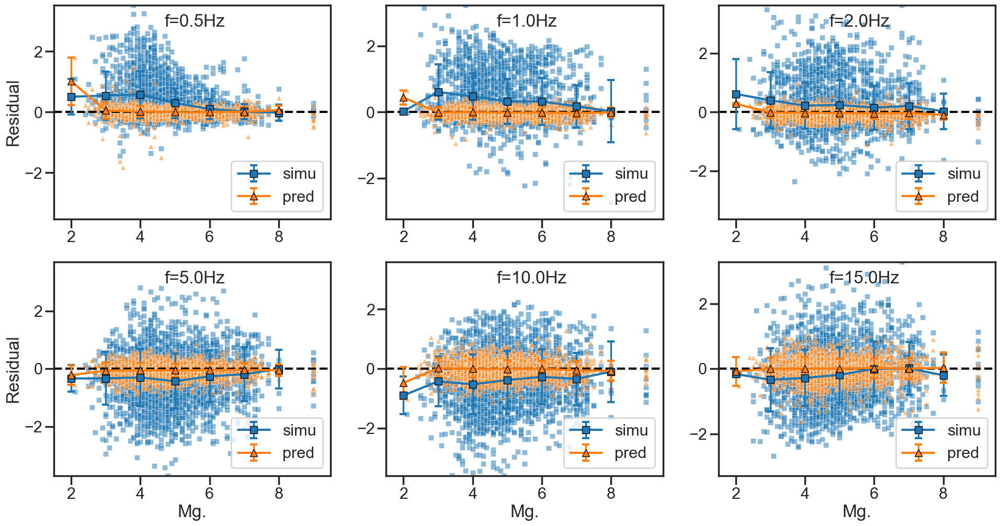

In [79]:
# 获取震级列表
value_list = source[:, 0]

# 将所有地震对应的震级按从小到大的顺序划分为10组，以便后面求解误差棒
value_min = np.round(np.min(value_list)) - 0.5
value_max = np.round(np.max(value_list)) + 0.5
value_step = 1
num_bar = int((value_max - value_min) / value_step)
sort_idx = np.argsort(value_list)
value_list = value_list[sort_idx]
N = len(value_list)
idx_err = []
value_err = np.arange(int(value_min + 0.5), int(value_max + 0.5))
for i in range(num_bar):
    idx = []
    for j, value in enumerate(value_list):
        if value >= value_min + i * value_step and value < value_min + (i + 1) * value_step:
            idx.append(j)
    idx_err.append(idx)

# 绘制残差随震级的分布图和分组误差棒
plt.figure(figsize=(18, 9))
plt.subplots_adjust(left=0,bottom=0,top=1,right=1,hspace=0.2,wspace=0.2)
for i, f in enumerate(freq_hz):
    idx = np.argmin(np.abs(freq - f))
    residual_points_pred = residual_pred[:, idx, 0]
    residual_points_pred = residual_points_pred[sort_idx]
    residual_points_simu = residual_simu[:, idx, 0]
    residual_points_simu = residual_points_simu[sort_idx]
    ylim = np.max([np.max(np.abs(residual_points_pred)), np.max(np.abs(residual_points_simu))])

    mean_err_pred, std_err_pred, mean_err_simu, std_err_simu = np.zeros(num_bar), np.zeros(num_bar), np.zeros(num_bar), np.zeros(num_bar)
    for j in range(num_bar):
        mean_err_pred[j] = np.mean(residual_points_pred[idx_err[j]])
        std_err_pred[j] = np.std(residual_points_pred[idx_err[j]])
        mean_err_simu[j] = np.mean(residual_points_simu[idx_err[j]])
        std_err_simu[j] = np.std(residual_points_simu[idx_err[j]])

    plt.subplot(2, 3, i + 1)
    plt.plot([value_min, value_max], [0, 0], 'k--')
    sns.scatterplot(x=value_list, y=residual_points_simu, s=50, color=colors[0], marker='s', alpha=0.5)
    plt.errorbar(value_err[:-1], mean_err_simu[:-1], std_err_simu[:-1], fmt='s-', ecolor=colors[0], ms=10, mfc=colors[0], mec='k', color=colors[0], elinewidth=2.5, capsize=5, capthick=3, label='simu')

    sns.scatterplot(x=value_list, y=residual_points_pred, s=50, color=colors[1], marker='^', alpha=0.5)
    plt.errorbar(value_err[:-1], mean_err_pred[:-1], std_err_pred[:-1], fmt='^-', ecolor=colors[1], ms=10, mfc=colors[1], mec='k', color=colors[1], elinewidth=2.5, capsize=5, capthick=3, label='pred')
    plt.xlim([value_min, value_max])
    plt.ylim([-ylim, ylim])
    if i >= 3:
        plt.xlabel('Mg.')
    if i in [0, 3]:
        plt.ylabel('Residual')
    plt.legend(loc='lower right')
    plt.text(0.6 * value_min + 0.4 * value_max, 0.8 * ylim, 'f=%.1fHz' % f, size=24)
plt.savefig(os.path.join(model_path, result_path, figure_path, 'residual_Mg.%s' % fig_fmt), dpi=300, bbox_inches='tight')

### 残差随震源深度的分布图

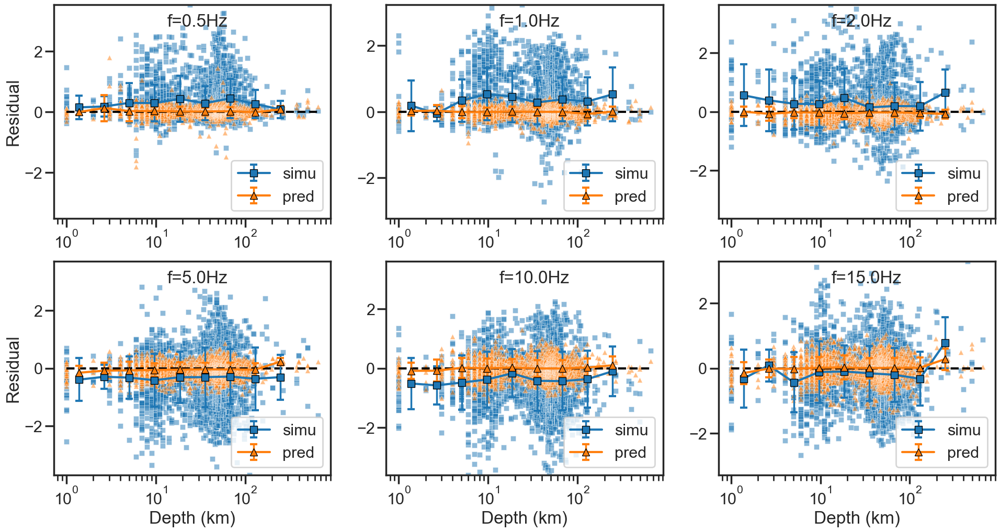

In [80]:
# 获取震源深度列表
depth_list = source[:, 1]
depth_list[depth_list < 1.0] = 1.0
value_list = depth_list

# 将所有地震对应的震源深度按从小到大的顺序划分为10组，以便后面求解误差棒
value_min = np.min(value_list)
value_max = np.max(value_list)
num_bar = 10
value_step = (np.log(value_max) - np.log(value_min)) / num_bar
sort_idx = np.argsort(value_list)
value_list = value_list[sort_idx]
N = len(value_list)
idx_err = []
value_err = np.exp(np.log(value_min) + (np.arange(num_bar) + 0.5) * value_step)
for i in range(num_bar):
    idx = []
    for j, value in enumerate(value_list):
        if np.log(value) >= np.log(value_min) + i * value_step and np.log(value) < np.log(value_min) + (i + 1) * value_step:
            idx.append(j)
    idx_err.append(idx)

# 绘制残差随震源深度的分布图和分组误差棒
plt.figure(figsize=(18, 9))
plt.subplots_adjust(left=0,bottom=0,top=1,right=1,hspace=0.2,wspace=0.2)
for i, f in enumerate(freq_hz):
    idx = np.argmin(np.abs(freq - f))
    residual_points_pred = residual_pred[:, idx, 0]
    residual_points_pred = residual_points_pred[sort_idx]
    residual_points_simu = residual_simu[:, idx, 0]
    residual_points_simu = residual_points_simu[sort_idx]
    ylim = np.max([np.max(np.abs(residual_points_pred)), np.max(np.abs(residual_points_simu))])

    mean_err_pred, std_err_pred, mean_err_simu, std_err_simu = np.zeros(num_bar), np.zeros(num_bar), np.zeros(num_bar), np.zeros(num_bar)
    for j in range(num_bar):
        mean_err_pred[j] = np.mean(residual_points_pred[idx_err[j]])
        std_err_pred[j] = np.std(residual_points_pred[idx_err[j]])
        mean_err_simu[j] = np.mean(residual_points_simu[idx_err[j]])
        std_err_simu[j] = np.std(residual_points_simu[idx_err[j]])

    plt.subplot(2, 3, i + 1)
    plt.plot([value_min, value_max], [0, 0], 'k--')
    sns.scatterplot(x=value_list, y=residual_points_simu, s=50, color=colors[0], marker='s', alpha=0.5)
    plt.errorbar(value_err[:-1], mean_err_simu[:-1], std_err_simu[:-1], fmt='s-', ecolor=colors[0], ms=10, mfc=colors[0], mec='k', color=colors[0], elinewidth=2.5, capsize=5, capthick=3, label='simu')

    sns.scatterplot(x=value_list, y=residual_points_pred, s=50, color=colors[1], marker='^', alpha=0.5)
    plt.errorbar(value_err[:-1], mean_err_pred[:-1], std_err_pred[:-1], fmt='^-', ecolor=colors[1], ms=10, mfc=colors[1], mec='k', color=colors[1], elinewidth=2.5, capsize=5, capthick=3, label='pred')
    # plt.xlim([value_min, value_max])
    plt.ylim([-ylim, ylim])
    if i >= 3:
        plt.xlabel('Depth (km)')
    if i in [0, 3]:
        plt.ylabel('Residual')
    plt.xscale('log')
    plt.legend(loc='lower right')
    plt.text(value_min ** 0.6 * value_max ** 0.4, 0.8 * ylim, 'f=%.1fHz' % f, size=24)
plt.savefig(os.path.join(model_path, result_path, figure_path, 'residual_Depth.%s' % fig_fmt), dpi=300, bbox_inches='tight')

### 残差随震中距的分布图

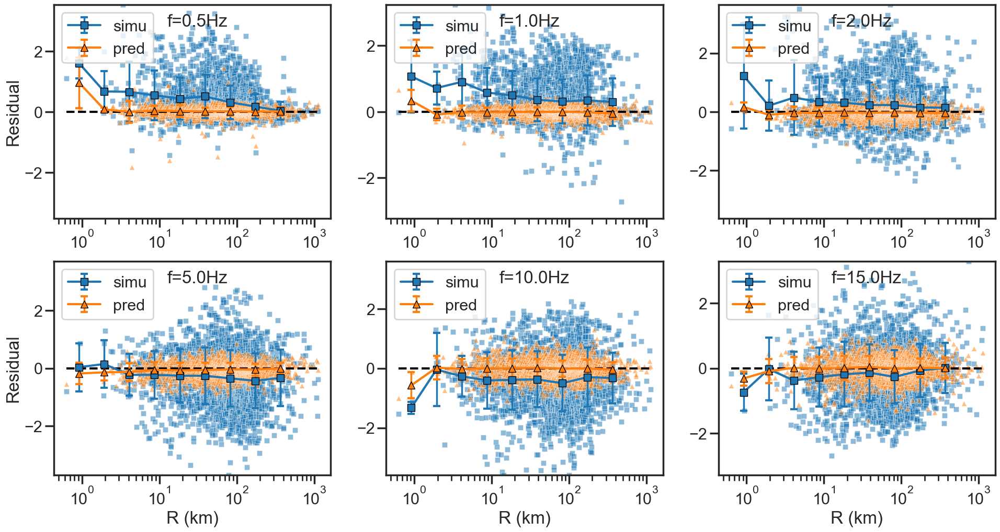

In [81]:
# 获取震中距列表
value_list = source[:, 2]

# 将所有地震对应的震中距按从小到大的顺序划分为10组，以便后面求解误差棒
value_min = np.min(value_list)
value_max = np.max(value_list)
num_bar = 10
value_step = (np.log(value_max) - np.log(value_min)) / num_bar
sort_idx = np.argsort(value_list)
value_list = value_list[sort_idx]
N = len(value_list)
idx_err = []
value_err = np.exp(np.log(value_min) + (np.arange(num_bar) + 0.5) * value_step)
for i in range(num_bar):
    idx = []
    for j, value in enumerate(value_list):
        if np.log(value) >= np.log(value_min) + i * value_step and np.log(value) < np.log(value_min) + (i + 1) * value_step:
            idx.append(j)
    idx_err.append(idx)

# 绘制残差随震中距的分布图和分组误差棒
plt.figure(figsize=(18, 9))
plt.subplots_adjust(left=0,bottom=0,top=1,right=1,hspace=0.2,wspace=0.2)
for i, f in enumerate(freq_hz):
    idx = np.argmin(np.abs(freq - f))
    residual_points_pred = residual_pred[:, idx, 0]
    residual_points_pred = residual_points_pred[sort_idx]
    residual_points_simu = residual_simu[:, idx, 0]
    residual_points_simu = residual_points_simu[sort_idx]
    ylim = np.max([np.max(np.abs(residual_points_pred)), np.max(np.abs(residual_points_simu))])

    mean_err_pred, std_err_pred, mean_err_simu, std_err_simu = np.zeros(num_bar), np.zeros(num_bar), np.zeros(num_bar), np.zeros(num_bar)
    for j in range(num_bar):
        mean_err_pred[j] = np.mean(residual_points_pred[idx_err[j]])
        std_err_pred[j] = np.std(residual_points_pred[idx_err[j]])
        mean_err_simu[j] = np.mean(residual_points_simu[idx_err[j]])
        std_err_simu[j] = np.std(residual_points_simu[idx_err[j]])

    plt.subplot(2, 3, i + 1)
    plt.plot([value_min, value_max], [0, 0], 'k--')
    sns.scatterplot(x=value_list, y=residual_points_simu, s=50, color=colors[0], marker='s', alpha=0.5)
    plt.errorbar(value_err[:-1], mean_err_simu[:-1], std_err_simu[:-1], fmt='s-', ecolor=colors[0], ms=10, mfc=colors[0], mec='k', color=colors[0], elinewidth=2.5, capsize=5, capthick=3, label='simu')

    sns.scatterplot(x=value_list, y=residual_points_pred, s=50, color=colors[1], marker='^', alpha=0.5)
    plt.errorbar(value_err[:-1], mean_err_pred[:-1], std_err_pred[:-1], fmt='^-', ecolor=colors[1], ms=10, mfc=colors[1], mec='k', color=colors[1], elinewidth=2.5, capsize=5, capthick=3, label='pred')
    # plt.xlim([value_min, value_max])
    plt.ylim([-ylim, ylim])
    if i >= 3:
        plt.xlabel('R (km)')
    if i in [0, 3]:
        plt.ylabel('Residual')
    plt.xscale('log')
    plt.legend(loc='upper left')
    plt.text(value_min ** 0.6 * value_max ** 0.4, 0.8 * ylim, 'f=%.1fHz' % f, size=24)
plt.savefig(os.path.join(model_path, result_path, figure_path, 'residual_Rup.%s' % fig_fmt), dpi=300, bbox_inches='tight')

## 绘制label和prediction的散点对比图

### 随频率的变化图

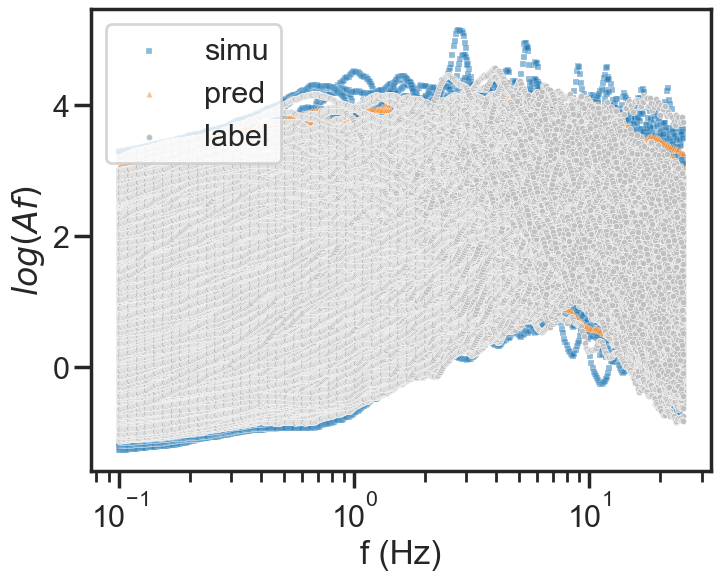

In [82]:
ymin = np.min([np.min(label[..., 0].ravel()), np.min(pred[..., 0].ravel()), np.min(simu[..., 0].ravel())])
ymax = np.max([np.max(label[..., 0].ravel()), np.max(pred[..., 0].ravel()), np.max(simu[..., 0].ravel())])
plt.figure(figsize=(8, 6))
sns.scatterplot(x=np.tile(freq, label.shape[0]), y=simu[..., 0].ravel(), s=20, label='simu', marker='s', color=colors[0], alpha=0.5)
sns.scatterplot(x=np.tile(freq, label.shape[0]), y=pred[..., 0].ravel(), s=20, label='pred', marker='^', color=colors[1], alpha=0.5)
sns.scatterplot(x=np.tile(freq, label.shape[0]), y=label[..., 0].ravel(), s=20, label='label', marker='o', color='silver')
# plt.ylim([ymin, 0.2 * ymax])
plt.xscale('log')
plt.xlabel('f (Hz)')
plt.ylabel('$log(Af)$')
plt.legend()
plt.savefig(os.path.join(model_path, result_path, figure_path, 'Af_scatter_freq.%s' % fig_fmt), dpi=300, bbox_inches='tight')

### 随地表PGA的变化图

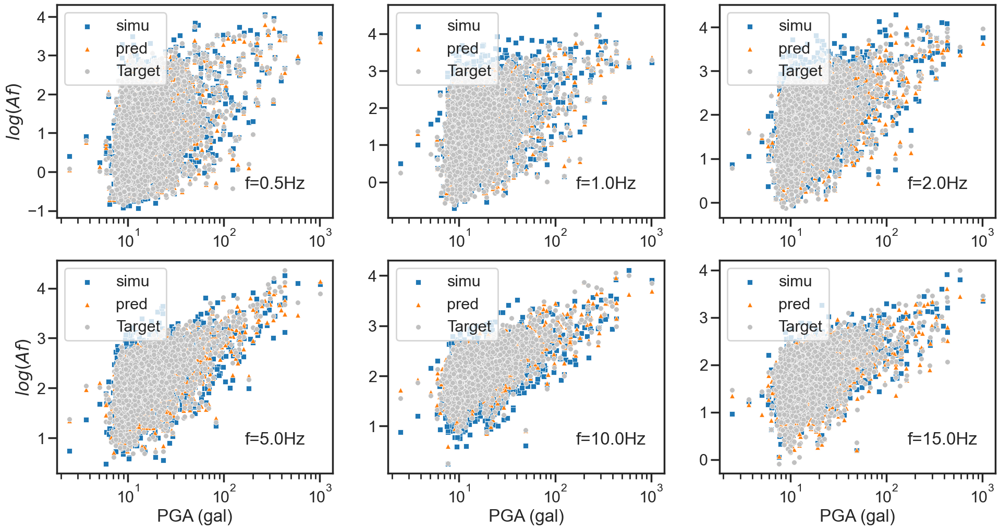

In [83]:
value_list = PGA

value_min = np.min(value_list)
value_max = np.max(value_list)

plt.figure(figsize=(18, 9))
plt.subplots_adjust(left=0,bottom=0,top=1,right=1,hspace=0.2,wspace=0.2)
for i, f in enumerate(freq_hz):
    idx = np.argmin(np.abs(freq - f))
    label_points = label[:, idx, 0]
    pred_points = pred[:, idx, 0]
    simu_points = simu[:, idx, 0]
    ymin = np.min([np.min(label_points), np.min(pred_points), np.min(simu_points)])
    ymax = np.max([np.max(label_points), np.max(pred_points), np.max(simu_points)])

    plt.subplot(2, 3, i + 1)
    sns.scatterplot(x=value_list, y=simu_points, label='simu', s=50, marker='s', color=colors[0])
    sns.scatterplot(x=value_list, y=pred_points, label='pred', s=50, marker='^', color=colors[1])
    sns.scatterplot(x=value_list, y=label_points, label='Target', s=50, marker='o', color='silver')
    plt.text(value_min ** 0.3 * value_max ** 0.7, ymin + 0.1 * (ymax - ymin), 'f=%.1fHz' % f, size=24)
    # plt.xlim([value_min, value_max])
    # plt.ylim([ymin, ymax])
    if i >= 3:
        plt.xlabel('PGA (gal)')
    if i in [0, 3]:
        plt.ylabel('$log(Af)$')
    plt.xscale('log')
    plt.legend(loc='upper left')
plt.savefig(os.path.join(model_path, result_path, figure_path, 'Af_scatter_PGA.%s' % fig_fmt), dpi=300, bbox_inches='tight')

### 随$v_{s30}$的变化图

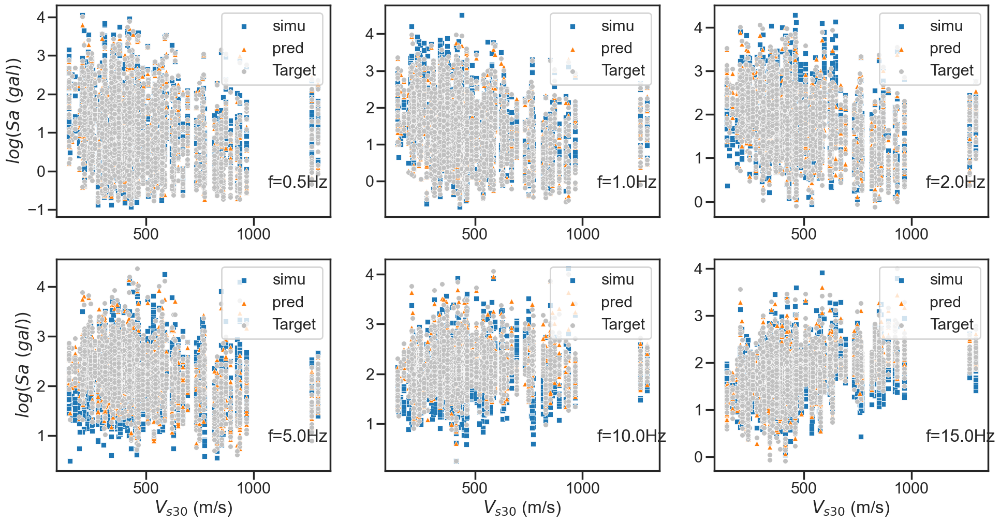

In [84]:
# 加载vs30数据并获取数据集中每条地震动对应的Vs30值
value_list = vs30

value_min = np.min(value_list)
value_max = np.max(value_list)

plt.figure(figsize=(18, 9))
plt.subplots_adjust(left=0,bottom=0,top=1,right=1,hspace=0.2,wspace=0.2)
for i, f in enumerate(freq_hz):
    idx = np.argmin(np.abs(freq - f))
    label_points = label[:, idx, 0]
    pred_points = pred[:, idx, 0]
    simu_points = simu[:, idx, 0]
    ymin = np.min([np.min(label_points), np.min(pred_points), np.min(simu_points)])
    ymax = np.max([np.max(label_points), np.max(pred_points), np.max(simu_points)])

    plt.subplot(2, 3, i + 1)
    sns.scatterplot(x=value_list, y=simu_points, label='simu', s=50, marker='s', color=colors[0])
    sns.scatterplot(x=value_list, y=pred_points, label='pred', s=50, marker='^', color=colors[1])
    sns.scatterplot(x=value_list, y=label_points, label='Target', s=50, marker='o', color='silver')
    plt.text(value_max - 0.2 * (value_max - value_min), ymin + 0.1 * (ymax - ymin), 'f=%.1fHz' % f, size=24)
    # plt.xlim([value_min - 0.05 * (value_max - value_min), value_max + 0.05 * (value_max - value_min)])
    # plt.ylim([ymin, ymax])
    if i >= 3:
        plt.xlabel('$V_{s30}$ (m/s)')
    if i in [0, 3]:
        plt.ylabel('$log(Sa\ (gal))$')
    plt.legend(loc='upper right')
plt.savefig(os.path.join(model_path, result_path, figure_path, 'Af_scatter_vs30.%s' % fig_fmt), dpi=300, bbox_inches='tight')

### 随震级的变化图

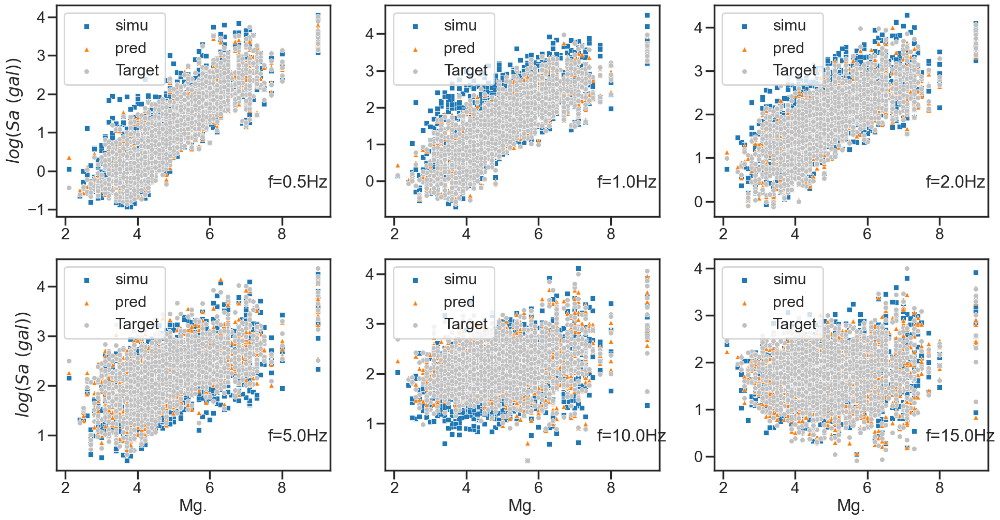

In [85]:
# 获取震级列表
value_list = source[:, 0]

value_min = np.min(value_list)
value_max = np.max(value_list)

plt.figure(figsize=(18, 9))
plt.subplots_adjust(left=0,bottom=0,top=1,right=1,hspace=0.2,wspace=0.2)
for i, f in enumerate(freq_hz):
    idx = np.argmin(np.abs(freq - f))
    label_points = label[:, idx, 0]
    pred_points = pred[:, idx, 0]
    simu_points = simu[:, idx, 0]
    ymin = np.min([np.min(label_points), np.min(pred_points), np.min(simu_points)])
    ymax = np.max([np.max(label_points), np.max(pred_points), np.max(simu_points)])

    plt.subplot(2, 3, i + 1)
    sns.scatterplot(x=value_list, y=simu_points, label='simu', s=50, marker='s', color=colors[0])
    sns.scatterplot(x=value_list, y=pred_points, label='pred', s=50, marker='^', color=colors[1])
    sns.scatterplot(x=value_list, y=label_points, label='Target', s=50, marker='o', color='silver')
    plt.text(value_max - 0.2 * (value_max - value_min), ymin + 0.1 * (ymax - ymin), 'f=%.1fHz' % f, size=24)
    # plt.xlim([value_min - 0.05 * (value_max - value_min), value_max + 0.05 * (value_max - value_min)])
    # plt.ylim([ymin, ymax])
    if i >= 3:
        plt.xlabel('Mg.')
    if i in [0, 3]:
        plt.ylabel('$log(Sa\ (gal))$')
    plt.legend(loc='upper left')
plt.savefig(os.path.join(model_path, result_path, figure_path, 'Af_scatter_Mg.%s' % fig_fmt), dpi=300, bbox_inches='tight')

### 随震源深度的变化图

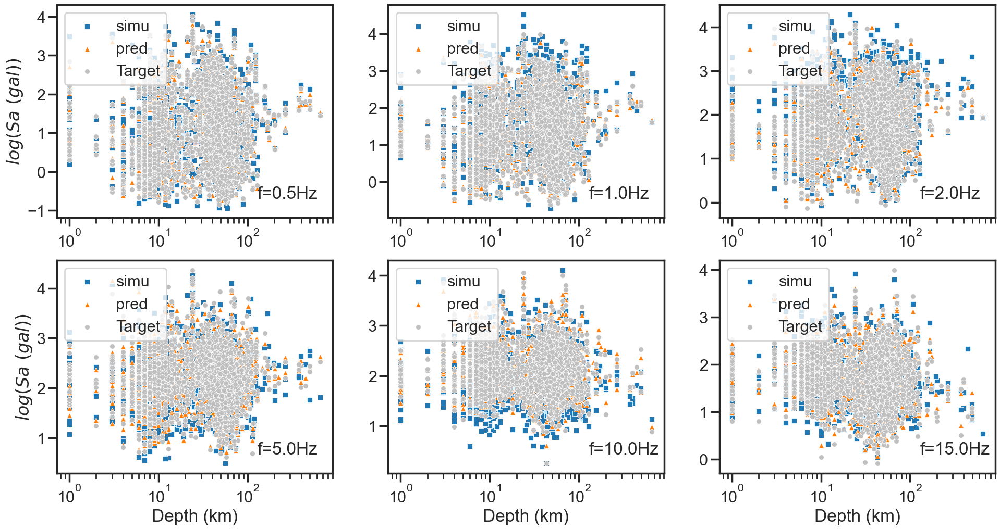

In [86]:
# 获取震源深度列表
value_list = source[:, 1]
value_list[value_list < 1.0] = 1.0

value_min = np.min(value_list)
value_max = np.max(value_list)

plt.figure(figsize=(18, 9))
plt.subplots_adjust(left=0,bottom=0,top=1,right=1,hspace=0.2,wspace=0.2)
for i, f in enumerate(freq_hz):
    idx = np.argmin(np.abs(freq - f))
    label_points = label[:, idx, 0]
    pred_points = pred[:, idx, 0]
    simu_points = simu[:, idx, 0]
    ymin = np.min([np.min(label_points), np.min(pred_points), np.min(simu_points)])
    ymax = np.max([np.max(label_points), np.max(pred_points), np.max(simu_points)])

    plt.subplot(2, 3, i + 1)
    sns.scatterplot(x=value_list, y=simu_points, label='simu', s=50, marker='s', color=colors[0])
    sns.scatterplot(x=value_list, y=pred_points, label='pred', s=50, marker='^', color=colors[1])
    sns.scatterplot(x=value_list, y=label_points, label='Target', s=50, marker='o', color='silver')
    plt.text(value_max ** 0.75 * value_min ** 0.25, ymin + 0.05 * (ymax - ymin), 'f=%.1fHz' % f, size=24)
    # plt.xlim([value_min - 0.05 * (value_max - value_min), value_max + 0.05 * (value_max - value_min)])
    # plt.ylim([ymin, ymax])
    if i >= 3:
        plt.xlabel('Depth (km)')
    if i in [0, 3]:
        plt.ylabel('$log(Sa\ (gal))$')
    plt.xscale('log')
    plt.legend(loc='upper left')
plt.savefig(os.path.join(model_path, result_path, figure_path, 'Af_scatter_Depth.%s' % fig_fmt), dpi=300, bbox_inches='tight')

### 随震中距的变化图

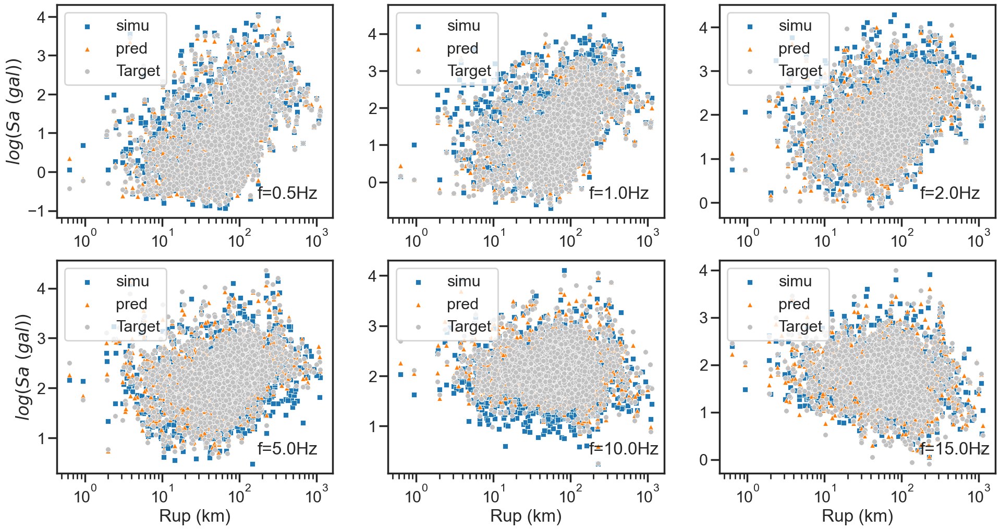

In [87]:
# 获取震中距列表
value_list = source[:, 2]
value_min = np.min(value_list)
value_max = np.max(value_list)

plt.figure(figsize=(18, 9))
plt.subplots_adjust(left=0,bottom=0,top=1,right=1,hspace=0.2,wspace=0.2)
for i, f in enumerate(freq_hz):
    idx = np.argmin(np.abs(freq - f))
    label_points = label[:, idx, 0]
    pred_points = pred[:, idx, 0]
    simu_points = simu[:, idx, 0]
    ymin = np.min([np.min(label_points), np.min(pred_points), np.min(simu_points)])
    ymax = np.max([np.max(label_points), np.max(pred_points), np.max(simu_points)])

    plt.subplot(2, 3, i + 1)
    sns.scatterplot(x=value_list, y=simu_points, label='simu', s=50, marker='s', color=colors[0])
    sns.scatterplot(x=value_list, y=pred_points, label='pred', s=50, marker='^', color=colors[1])
    sns.scatterplot(x=value_list, y=label_points, label='Target', s=50, marker='o', color='silver')
    plt.text(value_max ** 0.75 * value_min ** 0.25, ymin + 0.05 * (ymax - ymin), 'f=%.1fHz' % f, size=24)
    # plt.xlim([value_min - 0.05 * (value_max - value_min), value_max + 0.05 * (value_max - value_min)])
    # plt.ylim([ymin, ymax])
    if i >= 3:
        plt.xlabel('Rup (km)')
    if i in [0, 3]:
        plt.ylabel('$log(Sa\ (gal))$')
    plt.xscale('log')
    plt.legend(loc='upper left')
plt.savefig(os.path.join(model_path, result_path, figure_path, 'Af_scatter_Rup.%s' % fig_fmt), dpi=300, bbox_inches='tight')

# 特征周期或频率上的对比

## 提取特征周期或频率

In [88]:
predominant = pd.read_excel('predominant.xlsx')
period1, freq1 = [], []
pbar = tqdm(range(dataset.test_label.shape[0]), desc='Processing', ncols=100)
for i in pbar:
    event = dataset.test_events[dataset.test_idx[i]]
    pbar.set_description(event)
    if event in event_simu:
        period1.append(float(predominant[predominant['station'] == event[:6]]['period (s)']))
        freq1.append(float(predominant[predominant['station'] == event[:6]]['freq (Hz)']))
period1 = np.array(period1)
freq1 = np.array(freq1)

YMTH071611240623: 100%|████████████████████████████████████████| 2660/2660 [00:07<00:00, 343.79it/s]


## 特征频率上的预测和实际的对比图

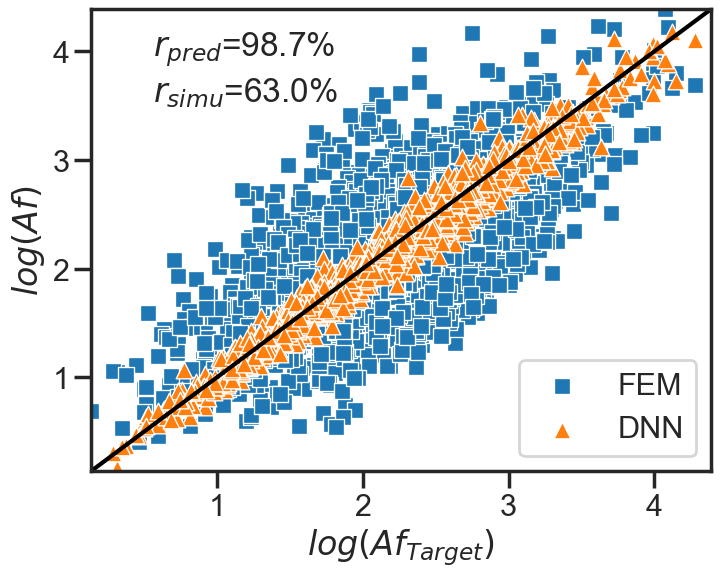

In [109]:
plt.figure(figsize=(8, 6))
label_points = np.zeros_like(freq1)
pred_points = np.zeros_like(freq1)
simu_points = np.zeros_like(freq1)
for i, f in enumerate(freq1):
    idx = np.argmin(np.abs(freq - f))
    label_points[i] = label[i, idx, 0]
    pred_points[i] = pred[i, idx, 0]
    simu_points[i] = simu[i, idx, 0]
r_pred = np.corrcoef(label_points, pred_points)[0, 1]
r_simu = np.corrcoef(label_points, simu_points)[0, 1]
xmin = np.min([np.min(label_points), np.min(pred_points), np.min(simu_points)])
xmax = np.max([np.max(label_points), np.max(pred_points), np.max(simu_points)])
sns.scatterplot(x=label_points, y=simu_points, label='FEM', marker='s', color=colors[0])
sns.scatterplot(x=label_points, y=pred_points, label='DNN', marker='^', color=colors[1])
plt.plot([xmin, xmax], [xmin, xmax], 'k', linewidth=3)
plt.text(0.9 * xmin + 0.1 * xmax, 0.1 * xmin + 0.9 * xmax, '$r_{pred}$=%.1f%%' % (100 * r_pred), size=24)
plt.text(0.9 * xmin + 0.1 * xmax, 0.2 * xmin + 0.8 * xmax, '$r_{simu}$=%.1f%%' % (100 * r_simu), size=24)
plt.xlim([xmin, xmax])
plt.ylim([xmin, xmax])
plt.xlabel('$log(Af_{Target})$')
plt.ylabel('$log(Af)$')
# plt.xscale('log')
# plt.yscale('log')
plt.legend(loc='lower right')
plt.savefig(os.path.join(model_path, result_path, figure_path, 'Af_f_compare_predominant.%s' % fig_fmt), dpi=300, bbox_inches='tight')

## 特征频率上的残差分布

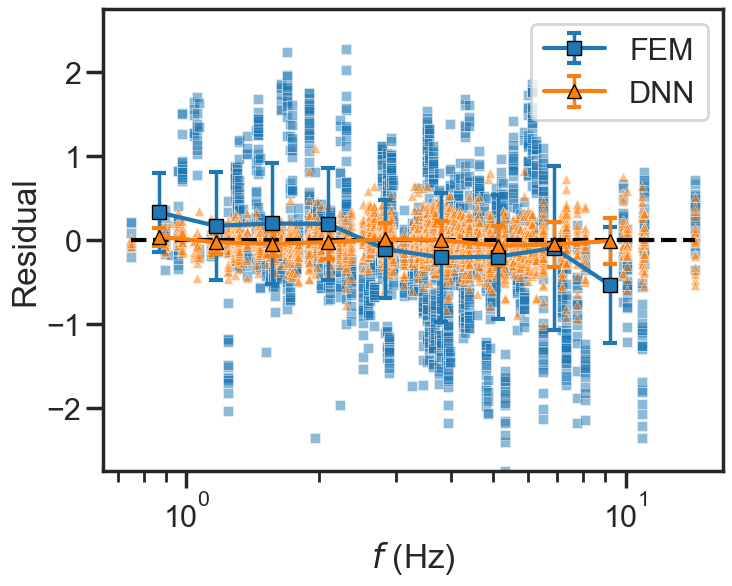

In [112]:
value_list = freq1

# 将所有地震的特征周期按从小到大的顺序划分为10组，以便后面求解误差棒
value_min = np.min(value_list)
value_max = np.max(value_list)
num_bar = 10
value_step = (np.log(value_max) - np.log(value_min)) / num_bar
sort_idx = np.argsort(value_list)
value_list = value_list[sort_idx]
N = len(value_list)
idx_err = []
value_err = np.exp((np.arange(num_bar) + 0.5) * value_step + np.log(value_min))
for i in range(num_bar):
    idx = []
    for j, value in enumerate(value_list):
        if np.log(value) >= np.log(value_min) + i * value_step and np.log(value) < np.log(value_min) + (i + 1) * value_step:
            idx.append(j)
    idx_err.append(idx)

# 绘制残差随特征周期的分布图和分组误差棒
residual_points_pred, residual_points_simu = np.zeros(len(value_list)), np.zeros(len(value_list))
for i, f in enumerate(value_list):
    idx = np.argmin(np.abs(freq - f))
    residual_points_pred[i] = residual_pred[i, idx, 0]
    residual_points_simu[i] = residual_simu[i, idx, 0]
ylim = np.max([np.max(np.abs(residual_points_pred)), np.max(np.abs(residual_points_simu))])

mean_err_pred, std_err_pred, mean_err_simu, std_err_simu = np.zeros(num_bar), np.zeros(num_bar), np.zeros(num_bar), np.zeros(num_bar)
for j in range(num_bar):
    mean_err_pred[j] = np.mean(residual_points_pred[idx_err[j]])
    std_err_pred[j] = np.std(residual_points_pred[idx_err[j]])
    mean_err_simu[j] = np.mean(residual_points_simu[idx_err[j]])
    std_err_simu[j] = np.std(residual_points_simu[idx_err[j]])

plt.figure(figsize=(8, 6))
plt.plot([value_min, value_max], [0, 0], 'k--')
sns.scatterplot(x=value_list, y=residual_points_simu, s=50, color=colors[0], marker='s', alpha=0.5)
plt.errorbar(value_err[:-1], mean_err_simu[:-1], std_err_simu[:-1], fmt='s-', ecolor=colors[0], ms=10, mfc=colors[0], mec='k', color=colors[0], elinewidth=2.5, capsize=5, capthick=3, label='FEM')

sns.scatterplot(x=value_list, y=residual_points_pred, s=50, color=colors[1], marker='^', alpha=0.5)
plt.errorbar(value_err[:-1], mean_err_pred[:-1], std_err_pred[:-1], fmt='^-', ecolor=colors[1], ms=10, mfc=colors[1], mec='k', color=colors[1], elinewidth=2.5, capsize=5, capthick=3, label='DNN')
# plt.xlim([value_min, value_max])
plt.ylim([-ylim, ylim])
plt.xscale('log')
plt.xlabel('$f$ (Hz)')
plt.ylabel('Residual')
plt.legend(loc='upper right')
plt.savefig(os.path.join(model_path, result_path, figure_path, 'residual_predominant.%s' % fig_fmt), dpi=300, bbox_inches='tight')

## 特征频率上的散点分布图

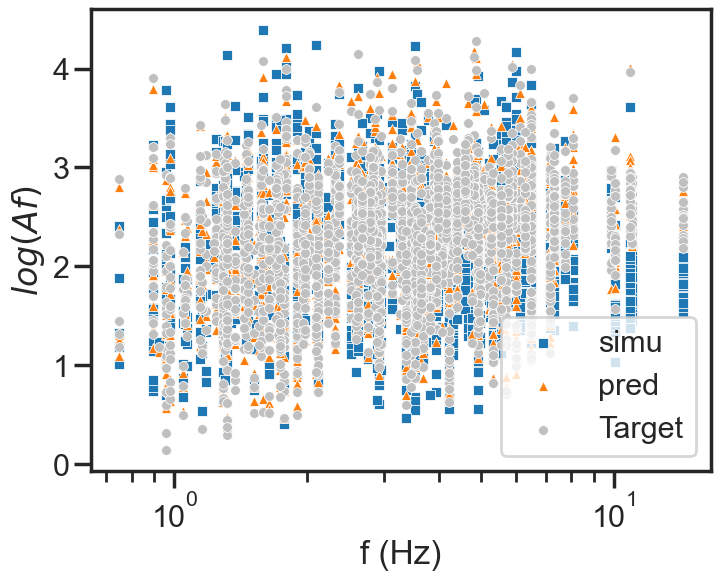

In [90]:
value_list = freq1

value_min = np.min(value_list)
value_max = np.max(value_list)

label_points, pred_points, simu_points = np.zeros(len(value_list)), np.zeros(len(value_list)), np.zeros(len(value_list))
for i, f in enumerate(value_list):
    idx = np.argmin(np.abs(freq - f))
    label_points[i] = label[i, idx, 0]
    pred_points[i] = pred[i, idx, 0]
    simu_points[i] = simu[i, idx, 0]
ymin = np.min([np.min(label_points), np.min(pred_points), np.min(simu_points)])
ymax = np.max([np.max(label_points), np.max(pred_points), np.max(simu_points)])

plt.figure(figsize=(8, 6))

sns.scatterplot(x=value_list, y=simu_points, label='simu', s=50, marker='s', color=colors[0])
sns.scatterplot(x=value_list, y=pred_points, label='pred', s=50, marker='^', color=colors[1])
sns.scatterplot(x=value_list, y=label_points, label='Target', s=50, marker='o', color='silver')
# plt.xlim([value_min, value_max])
# plt.ylim([ymin, ymax])
plt.xlabel('f (Hz)')
plt.ylabel('$log(Af)$')
plt.xscale('log')
# plt.legend(loc='upper left')
plt.savefig(os.path.join(model_path, result_path, figure_path, 'Af_scatter_predominant.%s' % fig_fmt), dpi=300, bbox_inches='tight')

# 不同通道模型与有限元模型的整体对比

## 训练曲线的对比

In [652]:
def plot_loss(train_loss, valid_loss, yscale='linear'):
    maxEpoch = len(train_loss)
    maxLoss = 1.1 * float(max(max(train_loss), max(valid_loss)))
    minLoss = max(0, 0.9 * float(min(min(train_loss), min(valid_loss))))

    plt.plot(range(1, 1 + maxEpoch), train_loss, label='Train', marker='o', markevery=int(maxEpoch / 10))
    plt.plot(range(1, 1 + maxEpoch), valid_loss, label='Valid', marker='s', markevery=int(maxEpoch / 10))

    # plt.xlabel('Epoch')
    # plt.ylabel('Loss')
    plt.legend()
    plt.xticks(range(0, maxEpoch + 1, int(maxEpoch / 5)))
    plt.axis([0, maxEpoch, minLoss, maxLoss])
    if yscale == 'log':
        plt.yscale('log')

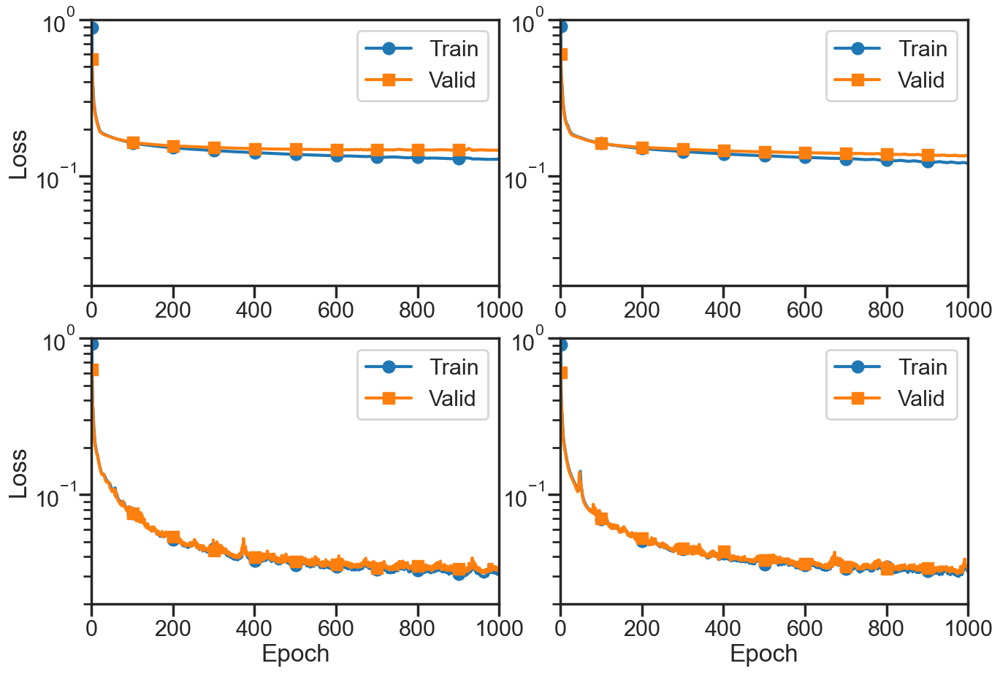

In [653]:
results1 = scipy.io.loadmat(os.path.join('inp_arg1_model_events', 'basic_1inps_100events_fts0', 'result.mat'))
results2 = scipy.io.loadmat(os.path.join('inp_arg2_model_events', 'basic_2inps_100events_fts0', 'result.mat'))
results3 = scipy.io.loadmat(os.path.join('inp_arg3_model_events', 'basic_3inps_100events_fts0', 'result.mat'))
results4 = scipy.io.loadmat(os.path.join('inp_arg2_model1_events', 'basic_2inps_100events_fts0', 'result.mat'))

plt.figure(figsize=(12, 8))
plt.subplots_adjust(left=0,bottom=0,top=1,right=1,hspace=0.2,wspace=0.15)
plt.subplot(2, 2, 1)
plot_loss(results1['train_loss'].ravel(), results1['valid_loss'].ravel(), yscale='log')
plt.ylim([0.02, 1])
plt.ylabel('Loss')
plt.subplot(2, 2, 2)
plot_loss(results4['train_loss'].ravel(), results4['valid_loss'].ravel(), yscale='log')
plt.ylim([0.02, 1])
plt.subplot(2, 2, 3)
plot_loss(results2['train_loss'].ravel(), results2['valid_loss'].ravel(), yscale='log')
plt.ylim([0.02, 1])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.subplot(2, 2, 4)
plot_loss(results3['train_loss'].ravel(), results3['valid_loss'].ravel(), yscale='log')
plt.ylim([0.02, 1])
plt.xlabel('Epoch')
plt.savefig('paper_figs/Loss.png', dpi=300, bbox_inches='tight')

## 数据处理

In [654]:
fig_path = 'compare_figs_events_freq'
fig_fmt = 'png'
freq = np.logspace(np.log10(0.1), np.log10(25), 500)
freq_hz = [0.5, 1.0, 2.0, 5.0, 10.0, 15.0]
event_msg = np.load('event_msg.npy', allow_pickle=True).item()
vs30_data = np.load('vs30.npy', allow_pickle=True).item()
source_data = np.load('source.npy', allow_pickle=True).item()
simu_data = np.load('FTS_simulate.npy', allow_pickle=True).item()

res_pred1_all, res_pred2_all, res_pred3_all, res_pred4_all, res_simu_all = [], [], [], [], []
MSE_pred1_all, MSE_pred2_all, MSE_pred3_all, MSE_pred4_all, MSE_simu_all = [], [], [], [], []
MAE_pred1_all, MAE_pred2_all, MAE_pred3_all, MAE_pred4_all, MAE_simu_all = [], [], [], [], []
for j in [0, 1, 2]:
    with open(os.path.join('inp_arg3_model_events', 'data_preprocess_100events_logFTS%d.pkl' % j), 'rb') as file:
        dataset = pickle.loads(file.read())
    results1 = scipy.io.loadmat(os.path.join('inp_arg1_model_events', 'basic_1inps_100events_fts%d' % j, 'result.mat'))
    results2 = scipy.io.loadmat(os.path.join('inp_arg2_model_events', 'basic_2inps_100events_fts%d' % j, 'result.mat'))
    results3 = scipy.io.loadmat(os.path.join('inp_arg3_model_events', 'basic_3inps_100events_fts%d' % j, 'result.mat'))
    results4 = scipy.io.loadmat(os.path.join('inp_arg2_model1_events', 'basic_2inps_100events_fts%d' % j, 'result.mat'))

    PGA, vs30, source= [], [], []
    label, pred1, pred2, pred3, pred4, simu = [], [], [], [], [], []
    event_simu = list(simu_data.keys())

    pbar = tqdm(range(dataset.test_label.shape[0]), desc='Processing', ncols=100)
    for i in pbar:
        event = dataset.test_events[dataset.test_idx[i]]
        pbar.set_description(event)
        if event in event_simu:
            label.append(dataset.test_label[i, ...])
            pred1.append(results1['test_pred'][i, ...])
            pred2.append(results2['test_pred'][i, ...])
            pred3.append(results3['test_pred'][i, ...])
            pred4.append(results4['test_pred'][i, ...])
            simu.append(981 * simu_data[event][..., None])
            PGA.append(981 * np.sqrt(event_msg[event][13] * event_msg[event][39]))
            vs30.append(vs30_data[event[:6]])
            source.append(source_data[event].ravel())

    label, pred1, pred2, pred3, pred4, simu = np.array(label), np.array(pred1), np.array(pred2), np.array(pred3), np.array(pred4), np.array(simu)
    label = label * dataset.label_std + dataset.label_mean
    simu = np.log10(simu)
    PGA, vs30, source = np.array(PGA), np.array(vs30), np.array(source)


    # 计算残差
    residual_pred1 = np.log(10) * (pred1 - label)
    residual_pred2 = np.log(10) * (pred2 - label)
    residual_pred3 = np.log(10) * (pred3 - label)
    residual_pred4 = np.log(10) * (pred4 - label)
    residual_simu = np.log(10) * (simu - label)
    res_pred1_all.append(residual_pred1)
    res_pred2_all.append(residual_pred2)
    res_pred3_all.append(residual_pred3)
    res_pred4_all.append(residual_pred4)
    res_simu_all.append(residual_simu)

    label_std = np.sqrt(np.mean((label - np.mean(label, axis=1)[:, None, :]) ** 2, axis=1)).ravel()

    MSE_pred1 = np.sqrt(np.mean((pred1 - label) ** 2, axis=1)).ravel() / label_std
    MSE_pred2 = np.sqrt(np.mean((pred2 - label) ** 2, axis=1)).ravel() / label_std
    MSE_pred3 = np.sqrt(np.mean((pred3 - label) ** 2, axis=1)).ravel() / label_std
    MSE_pred4 = np.sqrt(np.mean((pred4 - label) ** 2, axis=1)).ravel() / label_std
    MSE_simu = np.sqrt(np.mean((simu - label) ** 2, axis=1)).ravel() / label_std
    MSE_pred1_all.append(MSE_pred1)
    MSE_pred2_all.append(MSE_pred2)
    MSE_pred3_all.append(MSE_pred3)
    MSE_pred4_all.append(MSE_pred4)
    MSE_simu_all.append(MSE_simu)

    MAE_pred1 = np.max(np.abs(pred1 - label), axis=1).ravel() / label_std
    MAE_pred2 = np.max(np.abs(pred2 - label), axis=1).ravel() / label_std
    MAE_pred3 = np.max(np.abs(pred3 - label), axis=1).ravel() / label_std
    MAE_pred4 = np.max(np.abs(pred4 - label), axis=1).ravel() / label_std
    MAE_simu = np.max(np.abs(simu - label), axis=1).ravel() / label_std
    MAE_pred1_all.append(MAE_pred1)
    MAE_pred2_all.append(MAE_pred2)
    MAE_pred3_all.append(MAE_pred3)
    MAE_pred4_all.append(MAE_pred4)
    MAE_simu_all.append(MAE_simu)

YMTH071103141513: 100%|████████████████████████████████████████| 2660/2660 [00:06<00:00, 432.26it/s]


## 总体指标的均质和标准差计算

In [655]:
MSE_simu_mean = np.mean(np.concatenate(tuple(MSE_simu_all)))
MSE_simu_std = np.std(np.concatenate(tuple(MSE_simu_all)))
MSE_pred1_mean = np.mean(np.concatenate(tuple(MSE_pred1_all)))
MSE_pred1_std = np.std(np.concatenate(tuple(MSE_pred1_all)))
MSE_pred2_mean = np.mean(np.concatenate(tuple(MSE_pred2_all)))
MSE_pred2_std = np.std(np.concatenate(tuple(MSE_pred2_all)))
MSE_pred3_mean = np.mean(np.concatenate(tuple(MSE_pred3_all)))
MSE_pred3_std = np.std(np.concatenate(tuple(MSE_pred3_all)))
MSE_pred4_mean = np.mean(np.concatenate(tuple(MSE_pred4_all)))
MSE_pred4_std = np.std(np.concatenate(tuple(MSE_pred4_all)))

MAE_simu_mean = np.mean(np.concatenate(tuple(MAE_simu_all)))
MAE_simu_std = np.std(np.concatenate(tuple(MAE_simu_all)))
MAE_pred1_mean = np.mean(np.concatenate(tuple(MAE_pred1_all)))
MAE_pred1_std = np.std(np.concatenate(tuple(MAE_pred1_all)))
MAE_pred2_mean = np.mean(np.concatenate(tuple(MAE_pred2_all)))
MAE_pred2_std = np.std(np.concatenate(tuple(MAE_pred2_all)))
MAE_pred3_mean = np.mean(np.concatenate(tuple(MAE_pred3_all)))
MAE_pred3_std = np.std(np.concatenate(tuple(MAE_pred3_all)))
MAE_pred4_mean = np.mean(np.concatenate(tuple(MAE_pred4_all)))
MAE_pred4_std = np.std(np.concatenate(tuple(MAE_pred4_all)))

res_simu_mean = np.mean(np.mean(np.concatenate(tuple(res_simu_all)), axis=1))
res_simu_std = np.std(np.mean(np.concatenate(tuple(res_simu_all)), axis=1))
res_pred1_mean = np.mean(np.mean(np.concatenate(tuple(res_pred1_all)), axis=1))
res_pred1_std = np.std(np.mean(np.concatenate(tuple(res_pred1_all)), axis=1))
res_pred2_mean = np.mean(np.mean(np.concatenate(tuple(res_pred2_all)), axis=1))
res_pred2_std = np.std(np.mean(np.concatenate(tuple(res_pred2_all)), axis=1))
res_pred3_mean = np.mean(np.mean(np.concatenate(tuple(res_pred3_all)), axis=1))
res_pred3_std = np.std(np.mean(np.concatenate(tuple(res_pred3_all)), axis=1))
res_pred4_mean = np.mean(np.mean(np.concatenate(tuple(res_pred4_all)), axis=1))
res_pred4_std = np.std(np.mean(np.concatenate(tuple(res_pred4_all)), axis=1))

print('RMSE:\nsimu\tinp1\tinp2_1\tinp2\tinp3')
print('%.3f\t%.3f\t%.3f\t%.3f\t%.3f' % (MSE_simu_mean, MSE_pred1_mean, MSE_pred4_mean, MSE_pred2_mean, MSE_pred3_mean))
print('%.3f\t%.3f\t%.3f\t%.3f\t%.3f' % (MSE_simu_std, MSE_pred1_std, MSE_pred4_std, MSE_pred2_std, MSE_pred3_std))

print('RMAE:\nsimu\tinp1\tinp2_1\tinp2\tinp3')
print('%.3f\t%.3f\t%.3f\t%.3f\t%.3f' % (MAE_simu_mean, MAE_pred1_mean, MAE_pred4_mean, MAE_pred2_mean, MAE_pred3_mean))
print('%.3f\t%.3f\t%.3f\t%.3f\t%.3f' % (MAE_simu_std, MAE_pred1_std, MAE_pred4_std, MAE_pred2_std, MAE_pred3_std))

print('Residual:\nsimu\tinp1\tinp2_1\tinp2\tinp3')
print('%.3f\t%.3f\t%.3f\t%.3f\t%.3f' % (res_simu_mean, res_pred1_mean, res_pred4_mean, res_pred2_mean, res_pred3_mean))
print('%.3f\t%.3f\t%.3f\t%.3f\t%.3f' % (res_simu_std, res_pred1_std, res_pred4_std, res_pred2_std, res_pred3_std))

RMSE:
simu	inp1	inp2_1	inp2	inp3
0.533	0.294	0.287	0.133	0.133
0.216	0.149	0.148	0.069	0.068
RMAE:
simu	inp1	inp2_1	inp2	inp3
1.537	0.858	0.839	0.483	0.482
0.823	0.403	0.388	0.240	0.241
Residual:
simu	inp1	inp2_1	inp2	inp3
0.176	-0.002	0.004	0.001	-0.000
0.393	0.217	0.209	0.081	0.080


## 绘制整体残差、MSE、MAE的分布图对比

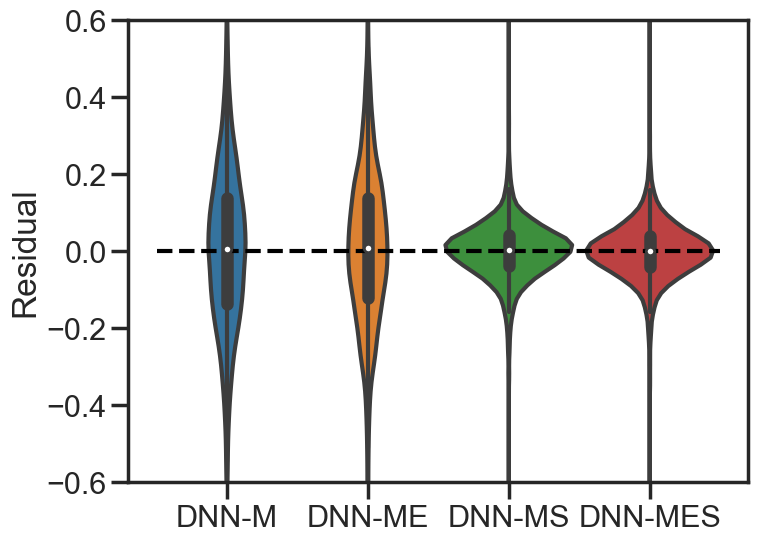

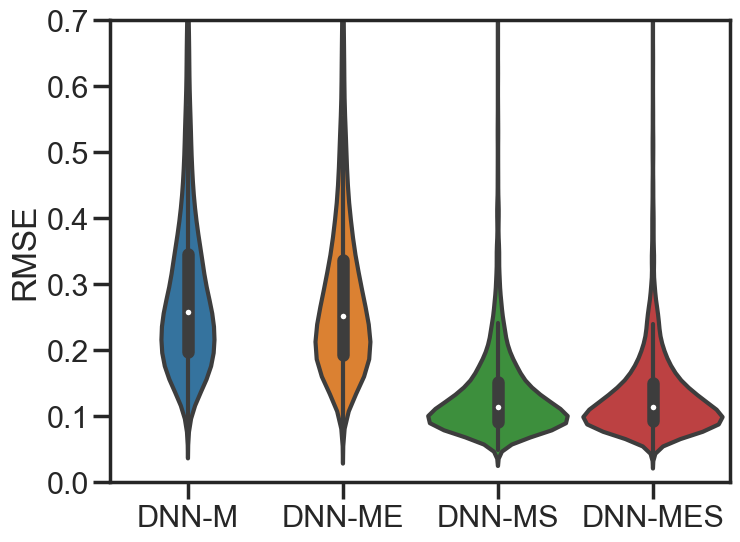

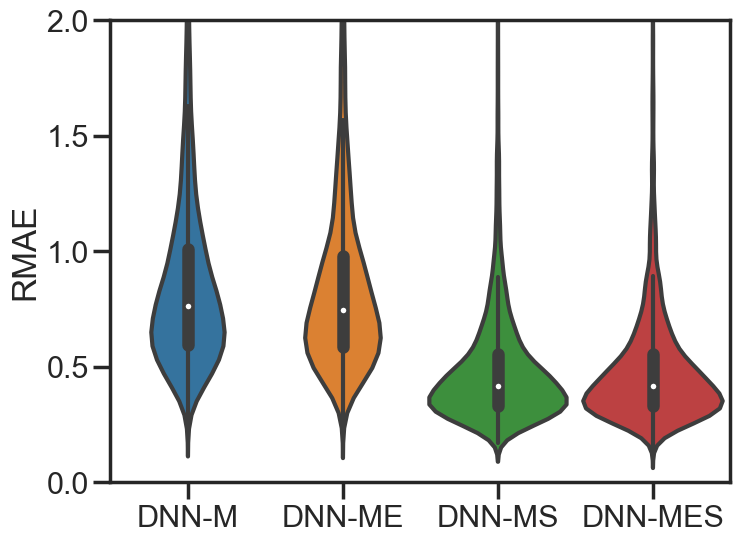

In [656]:
fig_fmt = 'png'
res_data = []
# res_data.append(np.mean(np.concatenate(tuple(res_simu_all)), axis=1).ravel())
res_data.append(np.mean(np.concatenate(tuple(res_pred1_all)), axis=1).ravel())
res_data.append(np.mean(np.concatenate(tuple(res_pred4_all)), axis=1).ravel())
res_data.append(np.mean(np.concatenate(tuple(res_pred2_all)), axis=1).ravel())
res_data.append(np.mean(np.concatenate(tuple(res_pred3_all)), axis=1).ravel())

MSE_data = []
# MSE_data.append(np.concatenate(tuple(MSE_simu_all)).ravel())
MSE_data.append(np.concatenate(tuple(MSE_pred1_all)).ravel())
MSE_data.append(np.concatenate(tuple(MSE_pred4_all)).ravel())
MSE_data.append(np.concatenate(tuple(MSE_pred2_all)).ravel())
MSE_data.append(np.concatenate(tuple(MSE_pred3_all)).ravel())

MAE_data = []
# MAE_data.append(np.concatenate(tuple(MAE_simu_all)).ravel())
MAE_data.append(np.concatenate(tuple(MAE_pred1_all)).ravel())
MAE_data.append(np.concatenate(tuple(MAE_pred4_all)).ravel())
MAE_data.append(np.concatenate(tuple(MAE_pred2_all)).ravel())
MAE_data.append(np.concatenate(tuple(MAE_pred3_all)).ravel())

plt.figure(figsize=(8, 6))
ax = sns.violinplot(data=res_data, saturation=0.7, width=0.9, whis=0.1)
ax.set_xticklabels(['DNN-M', 'DNN-ME', 'DNN-MS', 'DNN-MES'])
plt.ylabel('Residual')
plt.ylim([-0.6, 0.6])
plt.plot(list(ax.get_xlim()), [0, 0], 'k--')
plt.savefig(os.path.join(fig_path, 'Residual.%s' % fig_fmt), dpi=300, bbox_inches='tight')

plt.figure(figsize=(8, 6))
ax = sns.violinplot(data=MSE_data, saturation=0.7, width=0.9)
ax.set_xticklabels(['DNN-M', 'DNN-ME', 'DNN-MS', 'DNN-MES'])
plt.ylabel('RMSE')
plt.ylim([0, 0.7])
# plt.plot(list(ax.get_xlim()), [0, 0], 'k--')
plt.savefig(os.path.join(fig_path, 'RMSE.%s' % fig_fmt), dpi=300, bbox_inches='tight')

plt.figure(figsize=(8, 6))
ax = sns.violinplot(data=MAE_data, saturation=0.7, width=0.9)
ax.set_xticklabels(['DNN-M', 'DNN-ME', 'DNN-MS', 'DNN-MES'])
plt.ylabel('RMAE')
plt.ylim([0, 2])
# plt.plot(list(ax.get_xlim()), [0, 0], 'k--')
plt.savefig(os.path.join(fig_path, 'RMAE.%s' % fig_fmt), dpi=300, bbox_inches='tight')

## 不同频率上的残差对比

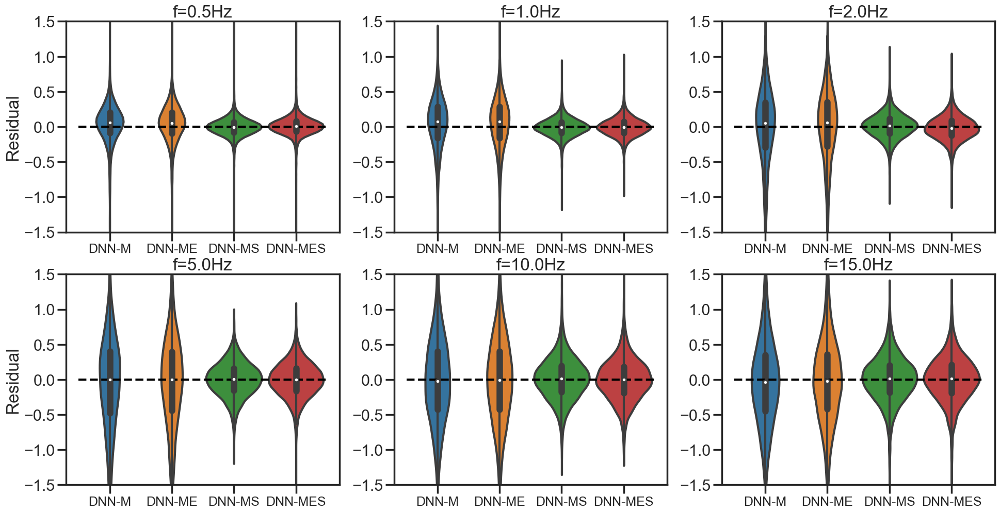

In [657]:
residual_simu = np.concatenate(tuple(res_simu_all))
residual_pred1 = np.concatenate(tuple(res_pred1_all))
residual_pred2 = np.concatenate(tuple(res_pred2_all))
residual_pred3 = np.concatenate(tuple(res_pred3_all))
residual_pred4 = np.concatenate(tuple(res_pred4_all))

plt.figure(figsize=(18, 9))
plt.subplots_adjust(left=0,bottom=0,top=1,right=1,hspace=0.2,wspace=0.2)
for i, f in enumerate(freq_hz):
    idx = np.argmin(np.abs(freq - f))

    plt.subplot(2, 3, i + 1)
    ax = sns.violinplot(data=[residual_pred1[:, idx, 0], residual_pred4[:, idx, 0], residual_pred2[:, idx, 0], residual_pred3[:, idx, 0]], saturation=0.7, width=0.9)
    plt.ylim([-1.5, 1.5])
    plt.plot(list(ax.get_xlim()), [0, 0], 'k--')
    ax.set_xticklabels(['DNN-M', 'DNN-ME', 'DNN-MS', 'DNN-MES'], fontdict={'fontsize': 18})
    if i in [0, 3]:
        plt.ylabel('Residual')
    plt.title('f=%.1fHz' % f, size=24)
    # plt.legend(loc='upper left')
plt.savefig(os.path.join(fig_path, 'Residual_freqs.%s' % fig_fmt), dpi=300, bbox_inches='tight')

# 特定地震的对比

## 加载数据

In [136]:
model_path = 'inp_arg3_model_events'
result_path = 'basic_3inps_100events_fts0'
fig_fmt = 'png'
with open(os.path.join(model_path, 'data_preprocess_100events_logFTS0.pkl'), 'rb') as file:
    dataset = pickle.loads(file.read())
results = scipy.io.loadmat(os.path.join(model_path, result_path, 'result.mat'))
print(results.keys())
freq = np.logspace(np.log10(0.1), np.log10(25), 500)
simu_data = np.load('FTS_simulate.npy', allow_pickle=True).item()

dict_keys(['__header__', '__version__', '__globals__', 'train_pred', 'test_pred', 'valid_pred', 'train_loss', 'valid_loss', 'train_performance', 'valid_performance', 'test_performance'])


## 绘图

In [ ]:
import matplotlib
# matplotlib.use('AGG')
data_type_list = ['test']

for data_type in data_type_list:

    if data_type == 'train':
        label = dataset.train_label
        pred = results['train_pred']
    elif data_type == 'valid':
        label = dataset.valid_label
        pred = results['valid_pred']
    else:
        label = dataset.test_label
        pred = results['test_pred']
    label = label * dataset.label_std + dataset.label_mean
    pbar = tqdm(range(len(label)), desc='Plotting', ncols=100)
    com_path = os.path.join(model_path, result_path, 'figs_com')
    if not os.path.exists(com_path):
        os.mkdir(com_path)
    err_ev = []
    for i in pbar:
        if data_type == 'train':
            ev = dataset.train_events[dataset.train_idx[i]]
        elif data_type == 'valid':
            ev = dataset.valid_events[dataset.valid_idx[i]]
        else:
            ev = dataset.test_events[dataset.test_idx[i]]
        pbar.set_description(ev)
        try:
            plt.figure(figsize=(16, 6))
            plt.subplot(1, 2, 1)
            plt.semilogx(freq, 10 ** label[i, ...], 'k', label='target')
            plt.semilogx(freq, 10 ** pred[i, ...], 'r', label='pred')
            plt.semilogx(freq, 981 * simu_data[ev], 'b', label='simu')
            plt.xlabel('f (Hz)')
            plt.ylabel('Af')
            # plt.yscale('log')
            plt.title(ev)
            plt.legend()
            plt.subplot(1, 2, 2)
            plt.semilogx(freq, 10 ** label[i, ...], 'k', label='target')
            plt.semilogx(freq, 10 ** pred[i, ...], 'r', label='pred')
            plt.semilogx(freq, 981 * simu_data[ev], 'b', label='simu')
            plt.xlabel('f (Hz)')
            plt.ylabel('Af')
            plt.yscale('log')
            plt.title(ev)
            plt.savefig(os.path.join(com_path, '%s-%s%d.%s' % (ev, data_type, i, fig_fmt)), dpi=150, bbox_inches='tight')
            plt.close()
        except:
            err_ev.append(ev)
    print(err_ev)

In [ ]:
# import matplotlib
# matplotlib.use('AGG')
data_type_list = ['test']

station_list = ['MYGH04', 'FKSH08', 'IBRH13', 'TKCH07']

for data_type in data_type_list:

    if data_type == 'train':
        label = dataset.train_label
        pred = results['train_pred']
    elif data_type == 'valid':
        label = dataset.valid_label
        pred = results['valid_pred']
    else:
        label = dataset.test_label
        pred = results['test_pred']
    label = label * dataset.label_std + dataset.label_mean
    pbar = tqdm(range(len(label)), desc='Plotting', ncols=100)
    com_path = os.path.join(model_path, result_path, 'figs_com')
    if not os.path.exists(com_path):
        os.mkdir(com_path)
    err_ev = []
    for i in pbar:
        if data_type == 'train':
            ev = dataset.train_events[dataset.train_idx[i]]
        elif data_type == 'valid':
            ev = dataset.valid_events[dataset.valid_idx[i]]
        else:
            ev = dataset.test_events[dataset.test_idx[i]]
        if ev[:6] in station_list:
            pbar.set_description(ev)
            try:
                plt.figure(figsize=(8, 6))
                plt.semilogx(freq, 10 ** label[i, ...], 'k', label='Record')
                plt.semilogx(freq, 981 * simu_data[ev], color=colors[0], label='FEM')
                plt.semilogx(freq, 10 ** pred[i, ...], color=colors[1], label='DNN')
                plt.xlabel('$f$ (Hz)')
                plt.ylabel('Af')
                plt.yscale('log')
                # plt.title(ev)
                plt.legend()
                plt.xlim([np.min(freq), np.max(freq)])
                plt.savefig(os.path.join(com_path, '%s-%s%d.%s' % (ev, data_type, i, fig_fmt)), dpi=300, bbox_inches='tight')
                plt.close()
            except:
                err_ev.append(ev)
    print(err_ev)

# 特定台站对比——傅里叶谱

## 加载数据

In [139]:
model_path = 'inp_arg3_model_events'
result_path = 'basic_3inps_100events_fts0'
fig_fmt = 'png'
with open(os.path.join(model_path, 'data_preprocess_100events_logFTS0.pkl'), 'rb') as file:
    dataset = pickle.loads(file.read())
results = scipy.io.loadmat(os.path.join(model_path, result_path, 'result.mat'))
print(results.keys())
freq = np.logspace(np.log10(0.1), np.log10(25), 500)
simu_data = np.load('FTS_simulate.npy', allow_pickle=True).item()

dict_keys(['__header__', '__version__', '__globals__', 'train_pred', 'test_pred', 'valid_pred', 'train_loss', 'valid_loss', 'train_performance', 'valid_performance', 'test_performance'])


## 绘图

### 对于按台站划分的情况

In [ ]:
data_type_list = ['test', 'train', 'valid']
for data_type in data_type_list:

    if data_type == 'train':
        data = dataset.train_data[0]
        label = dataset.train_label
        pred = results['train_pred']
        stations = dataset.train_stations
    elif data_type == 'valid':
        data = dataset.valid_data[0]
        label = dataset.valid_label
        pred = results['valid_pred']
        stations = dataset.valid_stations
    else:
        data = dataset.test_data[0]
        label = dataset.test_label
        pred = results['test_pred']
        stations = dataset.test_stations
    data = data * dataset.data_std[0] + dataset.data_mean[0]
    label = label * dataset.label_std + dataset.label_mean
    com_path = os.path.join(model_path, result_path, 'figs_com_sta')
    if not os.path.exists(com_path):
        os.mkdir(com_path)
    
    pbar = tqdm(stations, desc=stations[0], ncols=100)
    for station in pbar:
        pbar.set_description(station)
        err_ev = []
        label_all, pred_all, simu_all = [], [], []
        for i in range(len(label)):
            if data_type == 'train':
                ev = dataset.train_events[dataset.train_idx[i]]
            elif data_type == 'valid':
                ev = dataset.valid_events[dataset.valid_idx[i]]
            else:
                ev = dataset.test_events[dataset.test_idx[i]]
            if station in ev:
                try:
                    label_amp = label[i, ...] - data[i, ...]
                    pred_amp = pred[i, ...] - data[i, ...]
                    simu_amp = np.log10(981 * simu_data[ev][:, None]) - data[i, ...]
                    label_all.append(label_amp)
                    pred_all.append(pred_amp)
                    simu_all.append(simu_amp)
                    # plt.subplot(1, 2, 1)
                    # plt.semilogx(period, 10 ** label_amp, 'k', linewidth=0.5, alpha=0.5)
                    # plt.semilogx(period, 10 ** pred_amp, 'r', linewidth=0.5, alpha=0.5)
                    # plt.semilogx(period, 10 ** simu_amp, 'b', linewidth=0.5, alpha=0.5)
                    # plt.xlabel('T (s)')
                    # plt.ylabel('Amp.')
                    # plt.subplot(1, 2, 2)
                    # plt.semilogx(period, 10 ** label_amp, 'k', linewidth=0.5, alpha=0.5)
                    # plt.semilogx(period, 10 ** pred_amp, 'r', linewidth=0.5, alpha=0.5)
                    # plt.semilogx(period, 10 ** simu_amp, 'b', linewidth=0.5, alpha=0.5)
                    # plt.xlabel('T (s)')
                    # # plt.ylabel('Amp.')
                    # plt.yscale('log')
                except:
                    err_ev.append(ev)
            else:
                continue
        if len(label_all) > 1:
            plt.figure(figsize=(16, 6))
            plt.subplot(1, 2, 1)
            label_mean, label_std = np.mean(10 ** np.array(label_all), axis=0), np.std(10 ** np.array(label_all), axis=0)
            pred_mean, pred_std = np.mean(10 ** np.array(pred_all), axis=0), np.std(10 ** np.array(pred_all), axis=0)
            simu_mean, simu_std = np.mean(10 ** np.array(simu_all), axis=0), np.std(10 ** np.array(simu_all), axis=0)
            plt.semilogx(freq, label_mean, 'k', label='target')
            plt.fill_between(freq, (label_mean - label_std).ravel(), (label_mean + label_std).ravel(), color='k', alpha=0.2)
            plt.semilogx(freq, pred_mean, 'r', label='pred')
            plt.fill_between(freq, (pred_mean - pred_std).ravel(), (pred_mean + pred_std).ravel(), color='r', alpha=0.2)
            plt.semilogx(freq, simu_mean, 'b', label='simu')
            plt.fill_between(freq, (simu_mean - simu_std).ravel(), (simu_mean + simu_std).ravel(), color='b', alpha=0.2)
            plt.xlabel('f (Hz)')
            plt.ylabel('Amp.')
            # plt.yscale('log')
            plt.title(station)
            plt.legend()
            plt.subplot(1, 2, 2)
            label_mean, label_std = 10 ** np.mean(np.array(label_all), axis=0), 10 ** np.std(np.array(label_all), axis=0)
            pred_mean, pred_std = 10 ** np.mean(np.array(pred_all), axis=0), 10 ** np.std(np.array(pred_all), axis=0)
            simu_mean, simu_std = 10 ** np.mean(np.array(simu_all), axis=0), 10 ** np.std(np.array(simu_all), axis=0)
            plt.semilogx(freq, label_mean, 'k', label='target')
            plt.fill_between(freq, (label_mean / label_std).ravel(), (label_mean * label_std).ravel(), color='k', alpha=0.2)
            plt.semilogx(freq, pred_mean, 'r', label='pred')
            plt.fill_between(freq, (pred_mean / pred_std).ravel(), (pred_mean * pred_std).ravel(), color='r', alpha=0.2)
            plt.semilogx(freq, simu_mean, 'b', label='simu')
            plt.fill_between(freq, (simu_mean / simu_std).ravel(), (simu_mean * simu_std).ravel(), color='b', alpha=0.2)
            plt.xlabel('f (Hz)')
            # plt.ylabel('Amp.')
            plt.yscale('log')
            plt.title(station)
            plt.legend()
            plt.savefig(os.path.join(com_path, '%s-%s.%s' % (station, data_type, fig_fmt)), dpi=150, bbox_inches='tight')
            plt.close()

### 对于按事件划分的情况

In [115]:
data_type_list = ['test', 'train', 'valid']
for data_type in data_type_list:

    if data_type == 'train':
        data = dataset.train_data[0]
        label = dataset.train_label
        pred = results['train_pred']
        stations = list(set([sta[:6] for sta in dataset.train_events]))
    elif data_type == 'valid':
        data = dataset.valid_data[0]
        label = dataset.valid_label
        pred = results['valid_pred']
        stations = list(set([sta[:6] for sta in dataset.valid_events]))
    else:
        data = dataset.test_data[0]
        label = dataset.test_label
        pred = results['test_pred']
        stations = list(set([sta[:6] for sta in dataset.test_events]))
    data = data * dataset.data_std[0] + dataset.data_mean[0]
    label = label * dataset.label_std + dataset.label_mean
    com_path = os.path.join(model_path, result_path, 'figs_com_sta')
    if not os.path.exists(com_path):
        os.mkdir(com_path)
    
    pbar = tqdm(stations, desc=stations[0], ncols=100)
    for station in pbar:
        pbar.set_description(station)
        err_ev = []
        label_all, pred_all, simu_all = [], [], []
        for i in range(len(label)):
            if data_type == 'train':
                ev = dataset.train_events[dataset.train_idx[i]]
            elif data_type == 'valid':
                ev = dataset.valid_events[dataset.valid_idx[i]]
            else:
                ev = dataset.test_events[dataset.test_idx[i]]
            if station in ev:
                try:
                    label_amp = label[i, ...] - data[i, ...]
                    pred_amp = pred[i, ...] - data[i, ...]
                    simu_amp = np.log10(981 * simu_data[ev][:, None]) - data[i, ...]
                    label_all.append(label_amp)
                    pred_all.append(pred_amp)
                    simu_all.append(simu_amp)
                except:
                    err_ev.append(ev)
            else:
                continue
        if len(label_all) > 1:
            plt.figure(figsize=(16, 6))
            plt.subplot(1, 2, 1)
            label_mean, label_std = np.mean(10 ** np.array(label_all), axis=0), np.std(10 ** np.array(label_all), axis=0)
            pred_mean, pred_std = np.mean(10 ** np.array(pred_all), axis=0), np.std(10 ** np.array(pred_all), axis=0)
            simu_mean, simu_std = np.mean(10 ** np.array(simu_all), axis=0), np.std(10 ** np.array(simu_all), axis=0)
            plt.semilogx(freq, label_mean, 'k', label='target')
            plt.fill_between(freq, (label_mean - label_std).ravel(), (label_mean + label_std).ravel(), color='k', alpha=0.2)
            plt.semilogx(freq, pred_mean, 'r', label='pred')
            plt.fill_between(freq, (pred_mean - pred_std).ravel(), (pred_mean + pred_std).ravel(), color='r', alpha=0.2)
            plt.semilogx(freq, simu_mean, 'b', label='simu')
            plt.fill_between(freq, (simu_mean - simu_std).ravel(), (simu_mean + simu_std).ravel(), color='b', alpha=0.2)
            plt.xlabel('f (Hz)')
            plt.ylabel('Amp.')
            # plt.yscale('log')
            plt.title(station)
            plt.legend()
            plt.subplot(1, 2, 2)
            label_mean, label_std = 10 ** np.mean(np.array(label_all), axis=0), 10 ** np.std(np.array(label_all), axis=0)
            pred_mean, pred_std = 10 ** np.mean(np.array(pred_all), axis=0), 10 ** np.std(np.array(pred_all), axis=0)
            simu_mean, simu_std = 10 ** np.mean(np.array(simu_all), axis=0), 10 ** np.std(np.array(simu_all), axis=0)
            plt.semilogx(freq, label_mean, 'k', label='target')
            plt.fill_between(freq, (label_mean / label_std).ravel(), (label_mean * label_std).ravel(), color='k', alpha=0.2)
            plt.semilogx(freq, pred_mean, 'r', label='pred')
            plt.fill_between(freq, (pred_mean / pred_std).ravel(), (pred_mean * pred_std).ravel(), color='r', alpha=0.2)
            plt.semilogx(freq, simu_mean, 'b', label='simu')
            plt.fill_between(freq, (simu_mean / simu_std).ravel(), (simu_mean * simu_std).ravel(), color='b', alpha=0.2)
            plt.xlabel('f (Hz)')
            # plt.ylabel('Amp.')
            plt.yscale('log')
            plt.title(station)
            plt.legend()
            plt.savefig(os.path.join(com_path, '%s-%s.%s' % (station, data_type, fig_fmt)), dpi=150, bbox_inches='tight')
            plt.close()

MYGH01: 100%|█████████████████████████████████████████████████████| 133/133 [01:55<00:00,  1.16it/s]


In [140]:
data_type_list = ['test']
for data_type in data_type_list:

    if data_type == 'train':
        data = dataset.train_data[0]
        label = dataset.train_label
        pred = results['train_pred']
        stations = list(set([sta[:6] for sta in dataset.train_events]))
    elif data_type == 'valid':
        data = dataset.valid_data[0]
        label = dataset.valid_label
        pred = results['valid_pred']
        stations = list(set([sta[:6] for sta in dataset.valid_events]))
    else:
        data = dataset.test_data[0]
        label = dataset.test_label
        pred = results['test_pred']
        stations = list(set([sta[:6] for sta in dataset.test_events]))
    data = data * dataset.data_std[0] + dataset.data_mean[0]
    label = label * dataset.label_std + dataset.label_mean
    com_path = os.path.join(model_path, result_path, 'figs_com_sta_selec')
    if not os.path.exists(com_path):
        os.mkdir(com_path)
    
    pbar = tqdm(['MYGH04', 'FKSH08', 'IBRH13', 'TKCH07'], desc=stations[0], ncols=100)
    for station in pbar:
        pbar.set_description(station)
        err_ev = []
        label_all, pred_all, simu_all = [], [], []
        for i in range(len(label)):
            if data_type == 'train':
                ev = dataset.train_events[dataset.train_idx[i]]
            elif data_type == 'valid':
                ev = dataset.valid_events[dataset.valid_idx[i]]
            else:
                ev = dataset.test_events[dataset.test_idx[i]]
            if station in ev:
                try:
                    label_amp = label[i, ...] - data[i, ...]
                    pred_amp = pred[i, ...] - data[i, ...]
                    simu_amp = np.log10(981 * simu_data[ev][:, None]) - data[i, ...]
                    label_all.append(label_amp)
                    pred_all.append(pred_amp)
                    simu_all.append(simu_amp)
                except:
                    err_ev.append(ev)
            # else:
            #     continue
        if len(label_all) > 1:
            plt.figure(figsize=(8, 6))
            label_mean, label_std = 10 ** np.mean(np.array(label_all), axis=0), 10 ** np.std(np.array(label_all), axis=0)
            pred_mean, pred_std = 10 ** np.mean(np.array(pred_all), axis=0), 10 ** np.std(np.array(pred_all), axis=0)
            simu_mean, simu_std = 10 ** np.mean(np.array(simu_all), axis=0), 10 ** np.std(np.array(simu_all), axis=0)
            plt.semilogx(freq, label_mean, 'k', label='Record')
            plt.fill_between(freq, (label_mean / label_std).ravel(), (label_mean * label_std).ravel(), color='k', alpha=0.2)
            plt.semilogx(freq, simu_mean, color=colors[0], label='FEM')
            plt.fill_between(freq, (simu_mean / simu_std).ravel(), (simu_mean * simu_std).ravel(), color=colors[0], alpha=0.2)
            plt.semilogx(freq, pred_mean, color=colors[1], label='DNN')
            plt.fill_between(freq, (pred_mean / pred_std).ravel(), (pred_mean * pred_std).ravel(), color=colors[1], alpha=0.2)
            plt.xlabel('$f$ (Hz)')
            plt.ylabel('Amp.')
            plt.yscale('log')
            plt.xlim([np.min(freq), np.max(freq)])
            # plt.title(station)
            plt.legend()
            plt.savefig(os.path.join(com_path, '%s-%s.%s' % (station, data_type, fig_fmt)), dpi=300, bbox_inches='tight')
            plt.close()

MYGH04:   0%|                                                                 | 0/4 [00:00<?, ?it/s]

TKCH07: 100%|█████████████████████████████████████████████████████████| 4/4 [00:03<00:00,  1.16it/s]


# 在新台站的数据上进行预测

## 加载模型和数据

In [21]:
model_dir = 'inp_arg3_model_events'
model_path = 'basic_3inps_100events_fts0'
model = torch.load(os.path.join(model_dir, model_path, 'validbest.pt'))
fig_fmt = 'png'
with open(os.path.join(model_dir, 'data_preprocess_100events_logFTS0.pkl'), 'rb') as file:
    dataset = pickle.loads(file.read())
freq = np.logspace(np.log10(0.1), np.log10(25), 500)
result = scipy.io.loadmat(os.path.join(model_dir, model_path, 'result.mat'))

simu_data = np.load('FTS_simulate.npy', allow_pickle=True).item()
fts_dh = np.load('FTS_dh_stations.npy', allow_pickle=True).item()
fts_up = np.load('FTS_up_stations.npy', allow_pickle=True).item()
event_list = np.load('event.npy', allow_pickle=True).item()
vsvp = np.load('vsvp.npy', allow_pickle=True).item()
source = np.load('source.npy', allow_pickle=True).item()
for event, value in source.items():
    if value[1] < 1.0:
        source[event][1] = 1.0
    source[event][1] = np.log(source[event][1])
    source[event][2] = np.log(source[event][2])

## 取出未参与模型训练的台站的地震记录

In [22]:
other_event = {}
for sta, events in event_list.items():
    if sta not in dataset.event_list.keys():
        other_event[sta] = []
        for ev in events:
            if ev in simu_data.keys():
                other_event[sta].append(ev)

## 采用训练好的模型计算未知台站的响应

In [167]:
sta = 'NIGH13'
fig_path = os.path.join(model_dir, sta + '_figs')
if not os.path.exists(fig_path):
    os.makedirs(fig_path)
data0, data1, data2 = [], [], []
for event in other_event[sta]:
    data0.append(fts_dh[sta][event_list[sta].index(event), ...])
    data1.append(vsvp[sta])
    data2.append(source[event])
data0, data1, data2 = np.array(data0).astype(np.float32), np.array(data1).astype(np.float32), np.array(data2).astype(np.float32)
data0 = np.log10(data0)
data0 = (data0 - dataset.data_mean[0]) / dataset.data_std[0]
data1 = (data1 - dataset.data_mean[1]) / dataset.data_std[1]
data2 = (data2 - dataset.data_mean[2]) / dataset.data_std[2]
data = [torch.tensor(data0), torch.tensor(data1), torch.tensor(data2)]
data = [v.cuda() for v in data]
pred = model(data)
pred = pred.cpu().detach().numpy()
pred = pred * dataset.label_std + dataset.label_mean
pred = 10 ** pred

simu = []
label = []
inp = []

for ev in other_event[sta]:
    simu.append(981 * simu_data[ev][..., None])
    idx = event_list[sta].index(ev)
    label.append(fts_up[sta][idx, ...])
    inp.append(fts_dh[sta][idx, ...])
simu = np.array(simu)
label = np.array(label)
inp = np.array(inp)

## 结果处理

### 计算各评价指标，与模拟结果进行对比

In [168]:
label_std = np.sqrt(np.mean((np.log(label) - np.mean(np.log(label), axis=1)[:, None, :]) ** 2, axis=1))
MSE_simu = np.sqrt(np.mean((np.log(simu) - np.log(label)) ** 2))
MSE_pred = np.sqrt(np.mean((np.log(pred) - np.log(label)) ** 2))
RMSE_simu = np.mean(np.sqrt(np.mean((np.log(simu) - np.log(label)) ** 2, axis=1)) / label_std)
RMSE_pred = np.mean(np.sqrt(np.mean((np.log(pred) - np.log(label)) ** 2, axis=1)) / label_std)
MAE_simu = np.mean(np.abs(np.log(simu) - np.log(label)))
MAE_pred = np.mean(np.abs(np.log(pred) - np.log(label)))
RMAE_simu = np.mean(np.max(np.abs(np.log(simu) - np.log(label)), axis=1) / label_std)
RMAE_pred = np.mean(np.max(np.abs(np.log(pred) - np.log(label)), axis=1) / label_std)

r_all = np.zeros(label.shape[0])
for i in range(label.shape[0]):
    r_all[i] = np.corrcoef(np.log(label)[i, :, :].ravel(), np.log(simu)[i, :, :].ravel())[0, 1]
r_simu = np.mean(r_all)
r_all = np.zeros(label.shape[0])
for i in range(label.shape[0]):
    r_all[i] = np.corrcoef(np.log(label)[i, :, :].ravel(), np.log(pred)[i, :, :].ravel())[0, 1]
r_pred = np.mean(r_all)

print('模拟 | MSE: %.3E, RMSE: %.3E, MAE: %.3E, RMAE: %.3E, r: %.2f%%' % (MSE_simu, RMSE_simu, MAE_simu, RMAE_simu, 100 * r_simu))
print('预测 | MSE: %.3E, RMSE: %.3E, MAE: %.3E, RMAE: %.3E, r: %.2f%%' % (MSE_pred, RMSE_pred, MAE_pred, RMAE_pred, 100 * r_pred))

模拟 | MSE: 5.897E-01, RMSE: 4.221E-01, MAE: 4.235E-01, RMAE: 1.236E+00, r: 93.32%
预测 | MSE: 5.164E-01, RMSE: 3.674E-01, MAE: 3.398E-01, RMAE: 1.166E+00, r: 96.08%


### 有限元模型和深度学习模型预测和实测的对比图

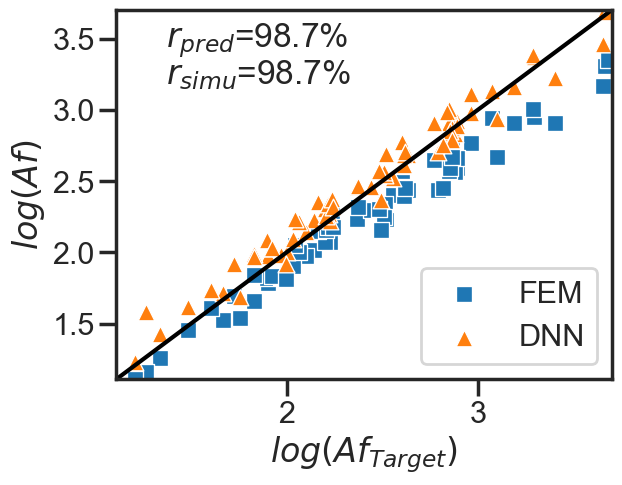

In [169]:
predominant = pd.read_excel('predominant.xlsx')
f = float(predominant[predominant['station'] == sta]['freq (Hz)'])
idx = np.argmin(np.abs(freq - f))

label_points = np.log10(label[:, idx, :]).ravel()
pred_points = np.log10(pred[:, idx, :]).ravel()
simu_points = np.log10(simu[:, idx, :]).ravel()
r_pred = np.corrcoef(label_points, pred_points)[0, 1]
r_simu = np.corrcoef(label_points, simu_points)[0, 1]
xmin = np.min([np.min(label_points), np.min(pred_points), np.min(simu_points)])
xmax = np.max([np.max(label_points), np.max(pred_points), np.max(simu_points)])
sns.scatterplot(x=label_points, y=simu_points, label='FEM', marker='s', color=colors[0])
sns.scatterplot(x=label_points, y=pred_points, label='DNN', marker='^', color=colors[1])
plt.plot([xmin, xmax], [xmin, xmax], 'k', linewidth=3)
plt.text(0.9 * xmin + 0.1 * xmax, 0.1 * xmin + 0.9 * xmax, '$r_{pred}$=%.1f%%' % (100 * r_pred), size=24)
plt.text(0.9 * xmin + 0.1 * xmax, 0.2 * xmin + 0.8 * xmax, '$r_{simu}$=%.1f%%' % (100 * r_simu), size=24)
plt.xlim([xmin, xmax])
plt.ylim([xmin, xmax])
plt.xlabel('$log(Af_{Target})$')
plt.ylabel('$log(Af)$')
plt.legend(loc='lower right')
plt.savefig(os.path.join(fig_path, 'Af_compare_freq1.png'), dpi=300, bbox_inches='tight')

### 残差随频率的分布图

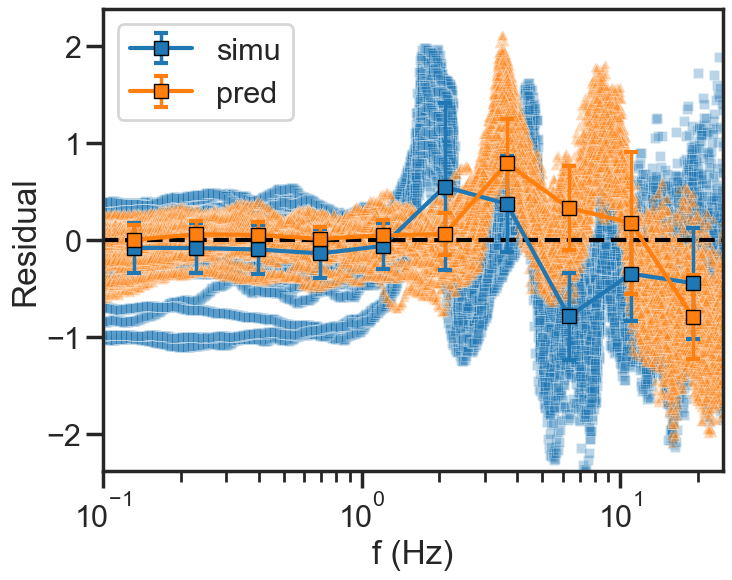

In [170]:
residual_pred = np.log(pred) - np.log(label)
residual_simu = np.log(simu) - np.log(label)

N = len(freq)
num_bar = 10
f_err, mean_err_pred, std_err_pred, mean_err_simu, std_err_simu = np.zeros(num_bar), np.zeros(num_bar), np.zeros(num_bar), np.zeros(num_bar), np.zeros(num_bar)
for i in range(num_bar):
    f_err[i] = freq[int((i + 0.5) * N / num_bar)]
    mean_err_pred[i] = np.mean(residual_pred[:, int(i * N / num_bar) : int((i + 1) * N / num_bar), 0])
    std_err_pred[i] = np.std(residual_pred[:, int(i * N / num_bar) : int((i + 1) * N / num_bar), 0])
    mean_err_simu[i] = np.mean(residual_simu[:, int(i * N / num_bar) : int((i + 1) * N / num_bar), 0])
    std_err_simu[i] = np.std(residual_simu[:, int(i * N / num_bar) : int((i + 1) * N / num_bar), 0])

ylim = np.max([np.max(np.abs(residual_pred)), np.max(np.abs(residual_simu))])
plt.figure(figsize=(8, 6))
plt.plot([np.min(freq), np.max(freq)], [0, 0], 'k--')
sns.scatterplot(x=np.tile(freq, residual_simu.shape[0]), y=residual_simu[..., 0].ravel(), s=50, color=colors[0], marker='s', alpha=0.3)
plt.errorbar(f_err, mean_err_simu, std_err_simu, fmt='s-', ecolor=colors[0], ms=10, mfc=colors[0], mec='k', color=colors[0], elinewidth=2.5, capsize=5, capthick=3, label='simu')
sns.scatterplot(x=np.tile(freq, residual_pred.shape[0]), y=residual_pred[..., 0].ravel(), s=50, color=colors[1], marker='^', alpha=0.3)
plt.errorbar(f_err, mean_err_pred, std_err_pred, fmt='s-', ecolor=colors[1], ms=10, mfc=colors[1], mec='k', color=colors[1], elinewidth=2.5, capsize=5, capthick=3, label='pred')
plt.xlim([np.min(freq), np.max(freq)])
plt.ylim([-ylim, ylim])
plt.xscale('log')
plt.xlabel('f (Hz)')
plt.ylabel('Residual')
plt.legend()
plt.savefig(os.path.join(fig_path, 'residual.png'), dpi=300, bbox_inches='tight')

### 绘制台站传递函数分布的对比图

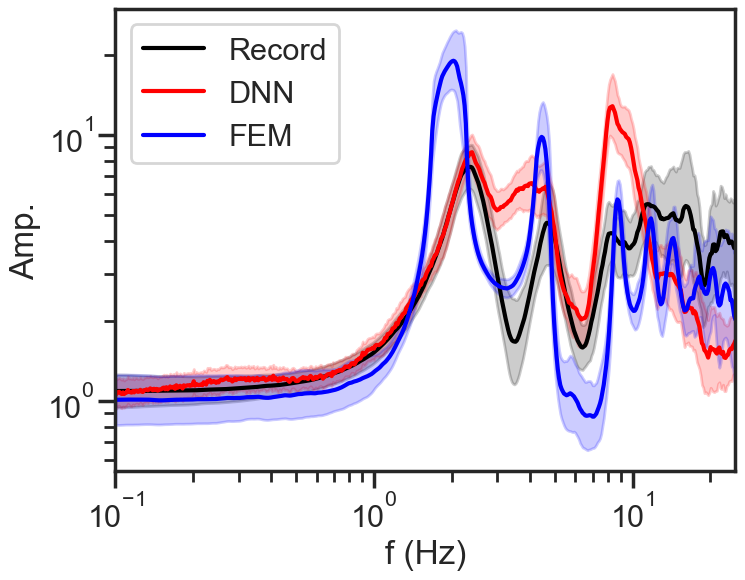

In [171]:
label_amp = label / inp
simu_amp = simu / inp
pred_amp = pred / inp

label_mean, label_std = np.exp(np.mean(np.log(label_amp), axis=0)), np.exp(np.std(np.log(label_amp), axis=0))
simu_mean, simu_std = np.exp(np.mean(np.log(simu_amp), axis=0)), np.exp(np.std(np.log(simu_amp), axis=0))
pred_mean, pred_std = np.exp(np.mean(np.log(pred_amp), axis=0)), np.exp(np.std(np.log(pred_amp), axis=0))

plt.figure(figsize=(8, 6))
plt.semilogx(freq, label_mean, 'k', label='Record')
plt.fill_between(freq, (label_mean / label_std).ravel(), (label_mean * label_std).ravel(), color='k', alpha=0.2)
plt.semilogx(freq, pred_mean, 'r', label='DNN')
plt.fill_between(freq, (pred_mean / pred_std).ravel(), (pred_mean * pred_std).ravel(), color='r', alpha=0.2)
plt.semilogx(freq, simu_mean, 'b', label='FEM')
plt.fill_between(freq, (simu_mean / simu_std).ravel(), (simu_mean * simu_std).ravel(), color='b', alpha=0.2)
plt.xlabel('f (Hz)')
plt.ylabel('Amp.')
plt.yscale('log')
plt.xlim([np.min(freq), np.max(freq)])
plt.legend()
plt.savefig(os.path.join(fig_path, 'TF.png'), dpi=300, bbox_inches='tight')

### 绘制单个地震记录的对比图

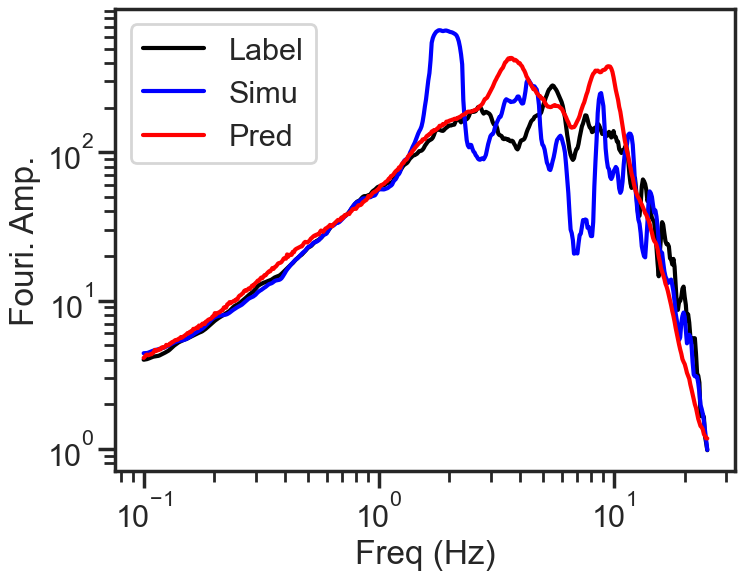

In [172]:
i = 0
idx = event_list[sta].index(other_event[sta][i])
plt.figure(figsize=(8, 6))
plt.loglog(freq, label[i, ...], color='k', label='Label')
plt.loglog(freq, simu[i, ...], color='b', label='Simu')
plt.loglog(freq, pred[i, ...], color='r', label='Pred')
plt.xlabel('Freq (Hz)')
plt.ylabel('Fouri. Amp.')
plt.legend()

## 再训练

### 准备再训练的新台站数据集

In [43]:
from eventDataset import *


data0, data1, data2 = [], [], []
output = []
for event in other_event[sta]:
    data0.append(fts_dh[sta][event_list[sta].index(event), ...])
    data1.append(vsvp[sta])
    data2.append(source[event])
    output.append(fts_up[sta][event_list[sta].index(event), ...])
data0, data1, data2 = np.array(data0).astype(np.float32), np.array(data1).astype(np.float32), np.array(data2).astype(np.float32)
output = np.array(output).astype(np.float32)

size_list = [5, 10, 20, 30, 40, 50]
for train_size in size_list:    
    new_dataset = DataProcesser([data0, data1, data2], output, other_event[sta])
    valid_size = 10

    new_dataset.train_data = [data0[:train_size, ...], data1[:train_size, ...], data2[:train_size, ...]]
    new_dataset.train_label = output[:train_size, ...]
    new_dataset.valid_data = [data0[train_size : train_size + valid_size, ...], data1[train_size : train_size + valid_size, ...], data2[train_size : train_size + valid_size, ...]]
    new_dataset.valid_label = output[train_size : train_size + valid_size, ...]
    new_dataset.test_data = [data0[train_size + valid_size:, ...], data1[train_size + valid_size:, ...], data2[train_size + valid_size:, ...]]
    new_dataset.test_label = output[train_size + valid_size:, ...]
    new_dataset.set_logscale()

    new_dataset.data_mean = dataset.data_mean
    new_dataset.data_std = dataset.data_std
    new_dataset.label_mean = dataset.label_mean
    new_dataset.label_std = dataset.label_std

    for i in range(len(new_dataset.train_data)):
        new_dataset.train_data[i] = (new_dataset.train_data[i] - new_dataset.data_mean[i]) / new_dataset.data_std[i]
        new_dataset.valid_data[i] = (new_dataset.valid_data[i] - new_dataset.data_mean[i]) / new_dataset.data_std[i]
        new_dataset.test_data[i] = (new_dataset.test_data[i] - new_dataset.data_mean[i]) / new_dataset.data_std[i]
    new_dataset.train_label = (new_dataset.train_label - new_dataset.label_mean) / new_dataset.label_std
    new_dataset.valid_label = (new_dataset.valid_label - new_dataset.label_mean) / new_dataset.label_std 
    new_dataset.test_label = (new_dataset.test_label - new_dataset.label_mean) / new_dataset.label_std 


    new_dataset.train_dataset = eqkDataset_multi_inps(new_dataset.train_data, new_dataset.train_label)
    new_dataset.valid_dataset = eqkDataset_multi_inps(new_dataset.valid_data, new_dataset.valid_label)
    new_dataset.test_dataset = eqkDataset_multi_inps(new_dataset.test_data, new_dataset.test_label)

    new_dataset.batch = 4
    new_dataset.train_loader = torch.utils.data.DataLoader(new_dataset.train_dataset, batch_size=new_dataset.batch)
    new_dataset.valid_loader = torch.utils.data.DataLoader(new_dataset.valid_dataset)
    new_dataset.test_loader = torch.utils.data.DataLoader(new_dataset.test_dataset)

    data_set_out = open(os.path.join(model_dir, '%s_100events_logFTS0_train%d.pkl' % (sta, train_size)), 'wb')
    data_set_out.write(pickle.dumps(new_dataset))
    data_set_out.close()

### 比较再训练后的结果和没训练及有限元结果

In [68]:
num_event = 20
label_retrain = label[-num_event:, ...]
simu_retrain = simu[-num_event:, ...]
pred_train0 = pred[-num_event:, ...]
pred_pre = []
pred_nopre = []
for size in size_list:
    results_pre = scipy.io.loadmat(os.path.join(model_dir, '%s_pretrain_train%d' % (sta, size), 'result.mat'))
    results_nopre = scipy.io.loadmat(os.path.join(model_dir, '%s_no_pretrain_train%d' % (sta, size), 'result.mat'))
    pred_pre.append(10 ** results_pre['test_pred'][-num_event:, ...])
    pred_nopre.append(10 ** results_nopre['test_pred'][-num_event:, ...])

label_std = np.sqrt(np.mean((np.log(label_retrain) - np.mean(np.log(label_retrain), axis=1)[:, None, :]) ** 2, axis=1))
RMSE_simu = np.sqrt(np.mean((np.log(simu_retrain) - np.log(label_retrain)) ** 2, axis=1)) / label_std
RMSE_train0 = np.sqrt(np.mean((np.log(pred_train0) - np.log(label_retrain)) ** 2, axis=1)) / label_std
RMAE_simu = np.max(np.abs(np.log(simu_retrain) - np.log(label_retrain)), axis=1) / label_std
RMAE_train0 = np.max(np.abs(np.log(pred_train0) - np.log(label_retrain)), axis=1) / label_std

RMSE_pre, RMAE_pre = [], []
RMSE_nopre, RMAE_nopre = [], []
for i in range(len(pred_pre)):
    RMSE_pre.append(np.sqrt(np.mean((np.log(pred_pre[i]) - np.log(label_retrain)) ** 2, axis=1)) / label_std)
    RMSE_nopre.append(np.sqrt(np.mean((np.log(pred_nopre[i]) - np.log(label_retrain)) ** 2, axis=1)) / label_std)
    RMAE_pre.append(np.max(np.abs(np.log(pred_pre[i]) - np.log(label_retrain)), axis=1) / label_std)
    RMAE_nopre.append(np.max(np.abs(np.log(pred_nopre[i]) - np.log(label_retrain)), axis=1) / label_std)

print('模型\t%9s\t%9s\t%9s\t%9s' % ('RMSE-mean', 'RMAE-mean', 'RMSE-std', 'RMAE-std'))
print('模拟\t%9.3E\t%9.3E\t%9.3E\t%9.3E' % (np.mean(RMSE_simu), np.mean(RMAE_simu), np.std(RMSE_simu), np.std(RMAE_simu)))
print('预测\t%9.3E\t%9.3E\t%9.3E\t%9.3E' % (np.mean(RMSE_train0), np.mean(RMAE_train0), np.std(RMSE_train0), np.std(RMAE_train0)))
for i, size in enumerate(size_list):
    print('%d_pre\t%9.3E\t%9.3E\t%9.3E\t%9.3E' % (size, np.mean(RMSE_pre[i]), np.mean(RMAE_pre[i]), np.std(RMSE_pre[i]), np.std(RMAE_pre[i])))
    print('%d_nop\t%9.3E\t%9.3E\t%9.3E\t%9.3E' % (size, np.mean(RMSE_nopre[i]), np.mean(RMAE_nopre[i]), np.std(RMSE_nopre[i]), np.std(RMAE_nopre[i])))

模型	RMSE-mean	RMAE-mean	 RMSE-std	 RMAE-std
模拟	5.217E-01	1.402E+00	2.197E-01	3.970E-01
预测	3.925E-01	1.279E+00	1.054E-01	3.462E-01
5_pre	2.311E-01	7.544E-01	7.647E-02	2.490E-01
5_nop	4.232E-01	1.161E+00	2.070E-01	4.440E-01
10_pre	2.286E-01	7.814E-01	7.826E-02	2.572E-01
10_nop	4.280E-01	1.249E+00	2.004E-01	5.314E-01
20_pre	2.134E-01	6.683E-01	6.456E-02	2.022E-01
20_nop	3.220E-01	1.072E+00	1.393E-01	4.102E-01
30_pre	2.227E-01	6.768E-01	8.570E-02	1.651E-01
30_nop	3.109E-01	8.665E-01	1.317E-01	2.621E-01
40_pre	2.254E-01	6.732E-01	8.883E-02	1.890E-01
40_nop	2.859E-01	9.048E-01	9.821E-02	2.723E-01
50_pre	2.705E-01	8.382E-01	1.097E-01	2.515E-01
50_nop	2.980E-01	9.395E-01	1.065E-01	3.651E-01


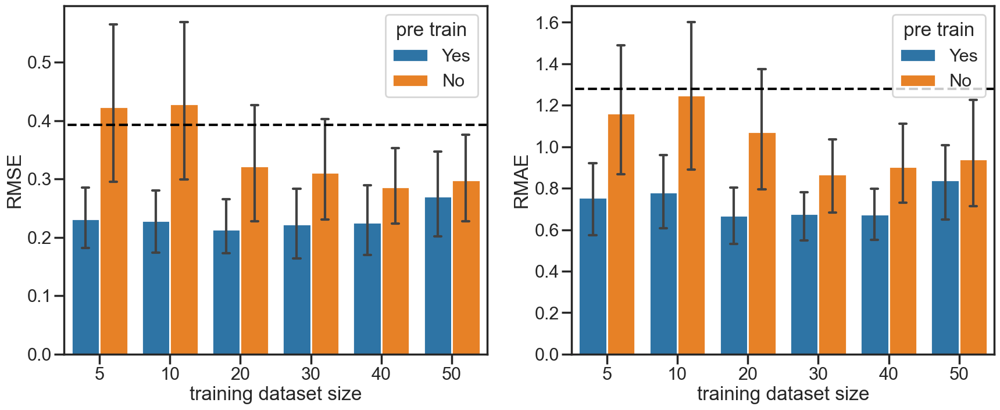

In [69]:
dataframe = pd.DataFrame(columns=['RMSE', 'RMAE', 'training dataset size', 'pre train'])
for i, size in enumerate(size_list):
    for j in range(len(RMSE_pre[i])):
        dataframe.loc[len(dataframe)] = [RMSE_pre[i][j, 0], RMAE_pre[i][j, 0], size, 'Yes']
        dataframe.loc[len(dataframe)] = [RMSE_nopre[i][j, 0], RMAE_nopre[i][j, 0], size, 'No']


plt.figure(figsize=(16, 6))
plt.subplots_adjust(left=0,bottom=0,top=1,right=1,hspace=0.2,wspace=0.2)
plt.subplot(1, 2, 1)
sns.barplot(x='training dataset size', y='RMSE', hue='pre train', data=dataframe, saturation=0.8, capsize=0.1, errwidth=3)
xlim = list(plt.gca().get_xlim())
plt.plot([-1, 6], [np.mean(RMSE_train0), np.mean(RMSE_train0)], 'k--')
plt.xlim(xlim)
plt.subplot(1, 2, 2)
sns.barplot(x='training dataset size', y='RMAE', hue='pre train', data=dataframe, saturation=0.8, capsize=0.1, errwidth=3)
xlim = list(plt.gca().get_xlim())
plt.plot([-1, 6], [np.mean(RMAE_train0), np.mean(RMAE_train0)], 'k--')
plt.xlim(xlim)
plt.savefig(os.path.join(fig_path, 'barplot_pretrain.png'), dpi=300, bbox_inches='tight')

### 绘制再训练模型的传递函数

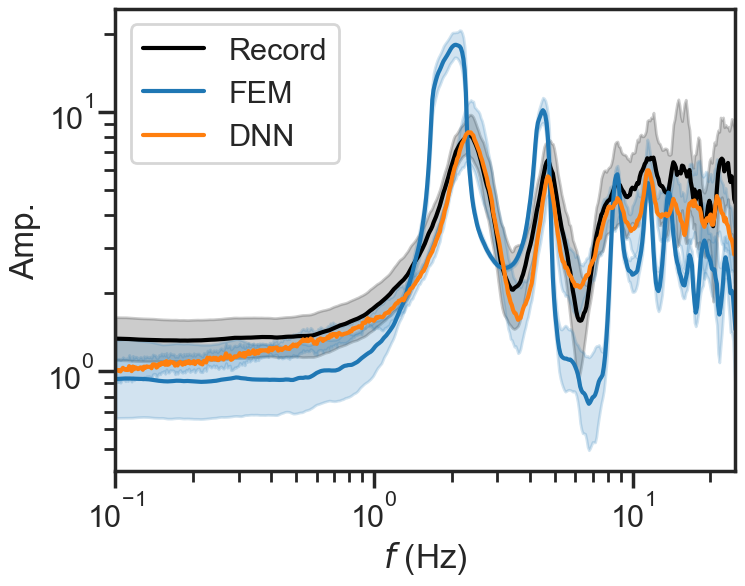

In [70]:
label_amp = label[-num_event:, ...] / inp[-num_event:, ...]
simu_amp = simu[-num_event:, ...] / inp[-num_event:, ...]
pred_amp = pred_pre[0] / inp[-num_event:, ...]
pred_amp_nopre = pred_nopre[0] / inp[-num_event:, ...]
pred_amp_train0 = pred_train0 / inp[-num_event:, ...]

label_mean, label_std = np.exp(np.mean(np.log(label_amp), axis=0)), np.exp(np.std(np.log(label_amp), axis=0))
simu_mean, simu_std = np.exp(np.mean(np.log(simu_amp), axis=0)), np.exp(np.std(np.log(simu_amp), axis=0))
pred_mean, pred_std = np.exp(np.mean(np.log(pred_amp), axis=0)), np.exp(np.std(np.log(pred_amp), axis=0))
pred_nopre_mean, pred_nopre_std = np.exp(np.mean(np.log(pred_amp_nopre), axis=0)), np.exp(np.std(np.log(pred_amp_nopre), axis=0))
pred_train0_mean, pred_train0_std = np.exp(np.mean(np.log(pred_amp_train0), axis=0)), np.exp(np.std(np.log(pred_amp_train0), axis=0))

plt.figure(figsize=(8, 6))
plt.semilogx(freq, label_mean, 'k', label='Record')
plt.fill_between(freq, (label_mean / label_std).ravel(), (label_mean * label_std).ravel(), color='k', alpha=0.2)
plt.semilogx(freq, simu_mean, color=colors[0], label='FEM')
plt.fill_between(freq, (simu_mean / simu_std).ravel(), (simu_mean * simu_std).ravel(), color=colors[0], alpha=0.2)
# plt.semilogx(freq, pred_train0_mean, 'r', label='DNN train0')
# plt.fill_between(freq, (pred_train0_mean / pred_train0_std).ravel(), (pred_train0_mean * pred_train0_std).ravel(), color='r', alpha=0.2)
plt.semilogx(freq, pred_mean, color=colors[1], label='DNN')
plt.fill_between(freq, (pred_mean / pred_std).ravel(), (pred_mean * pred_std).ravel(), color=colors[0], alpha=0.2)
# plt.semilogx(freq, pred_nopre_mean, color=colors[1], label='DNN nopre')
# plt.fill_between(freq, (pred_nopre_mean / pred_nopre_std).ravel(), (pred_nopre_mean * pred_nopre_std).ravel(), color=colors[1], alpha=0.2)
plt.xlabel('$f$ (Hz)')
plt.ylabel('Amp.')
plt.yscale('log')
plt.xlim([np.min(freq), np.max(freq)])
plt.legend()
plt.savefig(os.path.join(fig_path, 'TF_train5.png'), dpi=300, bbox_inches='tight')

## 按大小震再训练

### 准备再训练的新台站数据集

In [173]:
from eventDataset import *
evmsg = np.load('event_msg.npy', allow_pickle=True).item()

data0, data1, data2 = [], [], []
output = []
PGA= []
for event in other_event[sta]:
    data0.append(fts_dh[sta][event_list[sta].index(event), ...])
    data1.append(vsvp[sta])
    data2.append(source[event])
    output.append(fts_up[sta][event_list[sta].index(event), ...])
    PGA.append(np.sqrt(evmsg[event][13] * evmsg[event][39]))
PGA = np.array(PGA)
data0, data1, data2 = np.array(data0).astype(np.float32), np.array(data1).astype(np.float32), np.array(data2).astype(np.float32)
output = np.array(output).astype(np.float32)

small_idx, strong_idx = [], []
for i in range(len(PGA)):
    if PGA[i] >= 0.1:
        strong_idx.append(i)
    else:
        small_idx.append(i)

In [174]:
        
size_list = [5, 10, 20, 30, 40, 50]
for train_size in size_list:    
    new_dataset = DataProcesser([data0, data1, data2], output, other_event[sta])
    valid_size = 10

    new_dataset.train_data = [data0[small_idx[:train_size], ...], data1[small_idx[:train_size], ...], data2[small_idx[:train_size], ...]]
    new_dataset.train_label = output[small_idx[:train_size], ...]
    new_dataset.valid_data = [data0[small_idx[-valid_size:], ...], data1[small_idx[-valid_size:], ...], data2[small_idx[-valid_size:], ...]]
    new_dataset.valid_label = output[small_idx[-valid_size:], ...]
    new_dataset.test_data = [data0[strong_idx, ...], data1[strong_idx, ...], data2[strong_idx, ...]]
    new_dataset.test_label = output[strong_idx, ...]
    new_dataset.set_logscale()

    new_dataset.data_mean = dataset.data_mean
    new_dataset.data_std = dataset.data_std
    new_dataset.label_mean = dataset.label_mean
    new_dataset.label_std = dataset.label_std

    for i in range(len(new_dataset.train_data)):
        new_dataset.train_data[i] = (new_dataset.train_data[i] - new_dataset.data_mean[i]) / new_dataset.data_std[i]
        new_dataset.valid_data[i] = (new_dataset.valid_data[i] - new_dataset.data_mean[i]) / new_dataset.data_std[i]
        new_dataset.test_data[i] = (new_dataset.test_data[i] - new_dataset.data_mean[i]) / new_dataset.data_std[i]
    new_dataset.train_label = (new_dataset.train_label - new_dataset.label_mean) / new_dataset.label_std
    new_dataset.valid_label = (new_dataset.valid_label - new_dataset.label_mean) / new_dataset.label_std 
    new_dataset.test_label = (new_dataset.test_label - new_dataset.label_mean) / new_dataset.label_std 


    new_dataset.train_dataset = eqkDataset_multi_inps(new_dataset.train_data, new_dataset.train_label)
    new_dataset.valid_dataset = eqkDataset_multi_inps(new_dataset.valid_data, new_dataset.valid_label)
    new_dataset.test_dataset = eqkDataset_multi_inps(new_dataset.test_data, new_dataset.test_label)

    new_dataset.batch = 4
    new_dataset.train_loader = torch.utils.data.DataLoader(new_dataset.train_dataset, batch_size=new_dataset.batch)
    new_dataset.valid_loader = torch.utils.data.DataLoader(new_dataset.valid_dataset)
    new_dataset.test_loader = torch.utils.data.DataLoader(new_dataset.test_dataset)

    data_set_out = open(os.path.join(model_dir, '%s_100events_logFTS0_train%d.pkl' % (sta, train_size)), 'wb')
    data_set_out.write(pickle.dumps(new_dataset))
    data_set_out.close()

### 比较再训练后的结果和没训练及有限元的预测结果

In [175]:
label_retrain = label[strong_idx, ...]
simu_retrain = simu[strong_idx, ...]
pred_train0 = pred[strong_idx, ...]
pred_pre = []
pred_nopre = []
for size in size_list:
    results_pre = scipy.io.loadmat(os.path.join(model_dir, '%s_pretrain_train%d' % (sta, size), 'result.mat'))
    results_nopre = scipy.io.loadmat(os.path.join(model_dir, '%s_no_pretrain_train%d' % (sta, size), 'result.mat'))
    pred_pre.append(10 ** results_pre['test_pred'])
    pred_nopre.append(10 ** results_nopre['test_pred'])

label_std = np.sqrt(np.mean((np.log(label_retrain) - np.mean(np.log(label_retrain), axis=1)[:, None, :]) ** 2, axis=1))
RMSE_simu = np.sqrt(np.mean((np.log(simu_retrain) - np.log(label_retrain)) ** 2, axis=1)) / label_std
RMSE_train0 = np.sqrt(np.mean((np.log(pred_train0) - np.log(label_retrain)) ** 2, axis=1)) / label_std
RMAE_simu = np.max(np.abs(np.log(simu_retrain) - np.log(label_retrain)), axis=1) / label_std
RMAE_train0 = np.max(np.abs(np.log(pred_train0) - np.log(label_retrain)), axis=1) / label_std

RMSE_pre, RMAE_pre = [], []
RMSE_nopre, RMAE_nopre = [], []
for i in range(len(pred_pre)):
    RMSE_pre.append(np.sqrt(np.mean((np.log(pred_pre[i]) - np.log(label_retrain)) ** 2, axis=1)) / label_std)
    RMSE_nopre.append(np.sqrt(np.mean((np.log(pred_nopre[i]) - np.log(label_retrain)) ** 2, axis=1)) / label_std)
    RMAE_pre.append(np.max(np.abs(np.log(pred_pre[i]) - np.log(label_retrain)), axis=1) / label_std)
    RMAE_nopre.append(np.max(np.abs(np.log(pred_nopre[i]) - np.log(label_retrain)), axis=1) / label_std)

print('模型\t%9s\t%9s\t%9s\t%9s' % ('RMSE-mean', 'RMAE-mean', 'RMSE-std', 'RMAE-std'))
print('模拟\t%9.3E\t%9.3E\t%9.3E\t%9.3E' % (np.mean(RMSE_simu), np.mean(RMAE_simu), np.std(RMSE_simu), np.std(RMAE_simu)))
print('预测\t%9.3E\t%9.3E\t%9.3E\t%9.3E' % (np.mean(RMSE_train0), np.mean(RMAE_train0), np.std(RMSE_train0), np.std(RMAE_train0)))
for i, size in enumerate(size_list):
    print('%d_pre\t%9.3E\t%9.3E\t%9.3E\t%9.3E' % (size, np.mean(RMSE_pre[i]), np.mean(RMAE_pre[i]), np.std(RMSE_pre[i]), np.std(RMAE_pre[i])))
    print('%d_nop\t%9.3E\t%9.3E\t%9.3E\t%9.3E' % (size, np.mean(RMSE_nopre[i]), np.mean(RMAE_nopre[i]), np.std(RMSE_nopre[i]), np.std(RMAE_nopre[i])))

模型	RMSE-mean	RMAE-mean	 RMSE-std	 RMAE-std
模拟	4.328E-01	1.344E+00	8.527E-02	1.988E-01
预测	3.631E-01	1.151E+00	7.501E-02	2.859E-01
5_pre	2.604E-01	8.801E-01	6.565E-02	2.443E-01
5_nop	1.051E+00	1.987E+00	5.437E-01	6.820E-01
10_pre	2.594E-01	7.951E-01	6.843E-02	1.579E-01
10_nop	1.146E+00	1.994E+00	5.954E-01	7.884E-01
20_pre	2.413E-01	8.503E-01	7.205E-02	2.423E-01
20_nop	5.479E-01	1.182E+00	1.720E-01	2.879E-01
30_pre	2.442E-01	8.531E-01	8.897E-02	2.953E-01
30_nop	4.035E-01	1.028E+00	1.464E-01	2.912E-01
40_pre	2.584E-01	8.263E-01	1.115E-01	2.688E-01
40_nop	4.845E-01	1.032E+00	2.522E-01	3.553E-01
50_pre	2.559E-01	8.201E-01	8.769E-02	1.693E-01
50_nop	4.846E-01	1.044E+00	2.528E-01	2.815E-01


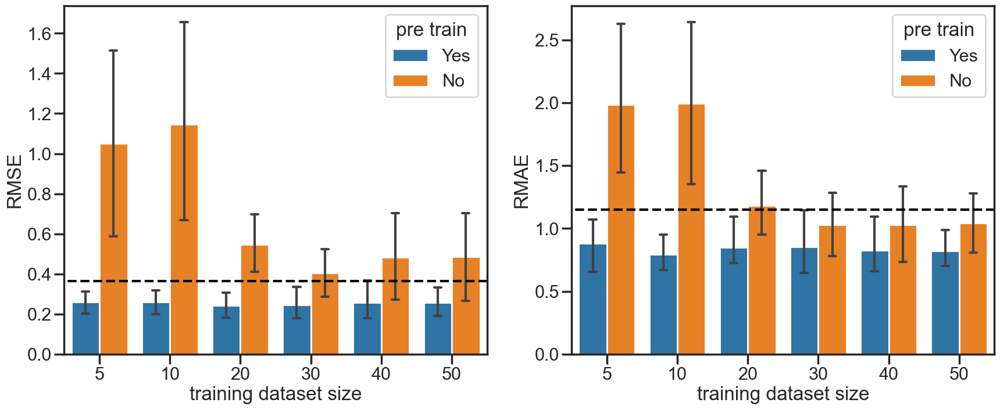

In [176]:
dataframe = pd.DataFrame(columns=['RMSE', 'RMAE', 'training dataset size', 'pre train'])
for i, size in enumerate(size_list):
    for j in range(len(RMSE_pre[i])):
        dataframe.loc[len(dataframe)] = [RMSE_pre[i][j, 0], RMAE_pre[i][j, 0], size, 'Yes']
        dataframe.loc[len(dataframe)] = [RMSE_nopre[i][j, 0], RMAE_nopre[i][j, 0], size, 'No']


plt.figure(figsize=(16, 6))
plt.subplots_adjust(left=0,bottom=0,top=1,right=1,hspace=0.2,wspace=0.2)
plt.subplot(1, 2, 1)
sns.barplot(x='training dataset size', y='RMSE', hue='pre train', data=dataframe, saturation=0.8, capsize=0.1, errwidth=3)
xlim = list(plt.gca().get_xlim())
plt.plot([-1, 6], [np.mean(RMSE_train0), np.mean(RMSE_train0)], 'k--')
plt.xlim(xlim)
plt.subplot(1, 2, 2)
sns.barplot(x='training dataset size', y='RMAE', hue='pre train', data=dataframe, saturation=0.8, capsize=0.1, errwidth=3)
xlim = list(plt.gca().get_xlim())
plt.plot([-1, 6], [np.mean(RMAE_train0), np.mean(RMAE_train0)], 'k--')
plt.xlim(xlim)
plt.savefig(os.path.join(fig_path, 'barplot_pretrain.png'), dpi=300, bbox_inches='tight')

### 绘制再训练模型的传递函数

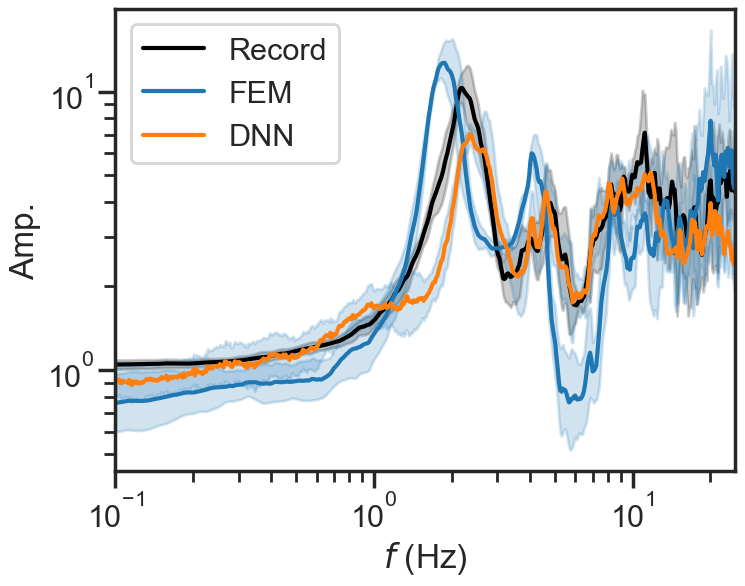

In [179]:
label_amp = label[strong_idx, ...] / inp[strong_idx, ...]
simu_amp = simu[strong_idx, ...] / inp[strong_idx, ...]
pred_amp = pred_pre[0] / inp[strong_idx, ...]
pred_amp_nopre = pred_nopre[0] / inp[strong_idx, ...]
# pred_amp_train0 = pred_train0 / inp[strong_idx, ...]
pred_amp_train0 = label[small_idx, ...] / inp[small_idx, ...]

label_mean, label_std = np.exp(np.mean(np.log(label_amp), axis=0)), np.exp(np.std(np.log(label_amp), axis=0))
simu_mean, simu_std = np.exp(np.mean(np.log(simu_amp), axis=0)), np.exp(np.std(np.log(simu_amp), axis=0))
pred_mean, pred_std = np.exp(np.mean(np.log(pred_amp), axis=0)), np.exp(np.std(np.log(pred_amp), axis=0))
pred_nopre_mean, pred_nopre_std = np.exp(np.mean(np.log(pred_amp_nopre), axis=0)), np.exp(np.std(np.log(pred_amp_nopre), axis=0))
pred_train0_mean, pred_train0_std = np.exp(np.mean(np.log(pred_amp_train0), axis=0)), np.exp(np.std(np.log(pred_amp_train0), axis=0))

plt.figure(figsize=(8, 6))
plt.semilogx(freq, label_mean, 'k', label='Record')
plt.fill_between(freq, (label_mean / label_std).ravel(), (label_mean * label_std).ravel(), color='k', alpha=0.2)
plt.semilogx(freq, simu_mean, color=colors[0], label='FEM')
plt.fill_between(freq, (simu_mean / simu_std).ravel(), (simu_mean * simu_std).ravel(), color=colors[0], alpha=0.2)
# plt.semilogx(freq, pred_train0_mean, 'r--', label='Small')
# plt.fill_between(freq, (pred_train0_mean / pred_train0_std).ravel(), (pred_train0_mean * pred_train0_std).ravel(), color='r', alpha=0.2)
plt.semilogx(freq, pred_mean, color=colors[1], label='DNN')
plt.fill_between(freq, (pred_mean / pred_std).ravel(), (pred_mean * pred_std).ravel(), color=colors[0], alpha=0.2)
# plt.semilogx(freq, pred_nopre_mean, color=colors[1], label='DNN nopre')
# plt.fill_between(freq, (pred_nopre_mean / pred_nopre_std).ravel(), (pred_nopre_mean * pred_nopre_std).ravel(), color=colors[1], alpha=0.2)
plt.xlabel('$f$ (Hz)')
plt.ylabel('Amp.')
plt.yscale('log')
plt.xlim([np.min(freq), np.max(freq)])
plt.legend()
plt.savefig(os.path.join(fig_path, 'TF_train5.png'), dpi=300, bbox_inches='tight')

# 使用一个台站波速数据和人工生成的地震数据来计算传递函数

## 加载模型

In [700]:
model_dir = 'inp_arg2_model_events'
model_path = 'basic_2inps_100events_fts0'
model = torch.load(os.path.join(model_dir, model_path, 'validbest.pt'))
with open(os.path.join(model_dir, 'data_preprocess_100events_logFTS0.pkl'), 'rb') as file:
    dataset = pickle.loads(file.read())
freq = np.logspace(np.log10(0.1), np.log10(25), 500)
result = scipy.io.loadmat(os.path.join(model_dir, model_path, 'result.mat'))

## 使用其他地震数据构造输入数据

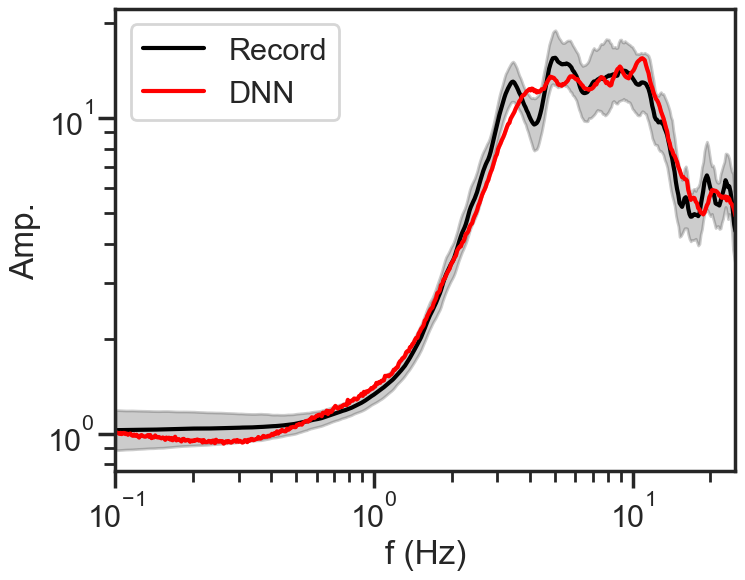

In [768]:
motions = []
coef = int(0.2 * len(freq))
motion_list = os.listdir('NGA')
for name in motion_list:
    accdata = np.loadtxt(os.path.join('NGA', name))
    dt = accdata[1, 0] - accdata[0, 0]
    acc = accdata[:, 1] * 981
    _, ft = getFourierSpectrum(acc, dt, freq, smooth='movemean', coef=coef)
    motions.append(ft)


motions = np.array(motions)[..., None] / 100
sta = list(dataset.event_list.keys())[56]
inp = []
label = []
for i, event in enumerate(dataset.train_events):
    if sta in event:
        inp.append(dataset.train_data[0][i, ...])
        label.append(dataset.train_label[i, ...])
        vsvp = dataset.train_data[1][i, ...]
inp = np.array(inp)
label = np.array(label)

motions = 10 ** np.expand_dims(dataset.data_mean[0], axis=0).repeat(50, axis=0)
data0, data1 = [], []
data0 = motions.astype(np.float32)
data0 = np.log10(data0)
for i in range(data0.shape[0]):
    data1.append(vsvp)
data1 = np.array(data1).astype(np.float32)

data0 = (data0 - dataset.data_mean[0]) / dataset.data_std[0]
data = [torch.tensor(data0), torch.tensor(data1)]
data = [v.cuda() for v in data]
pred = model(data)
pred = pred.cpu().detach().numpy()
pred = pred * dataset.label_std + dataset.label_mean
pred = 10 ** pred

inp = inp * dataset.data_std[0] + dataset.data_mean[0]
label = label * dataset.label_std + dataset.label_mean
inp = 10 ** inp
label = 10 ** label


label_amp = label / inp
pred_amp = pred / motions

label_mean, label_std = np.exp(np.mean(np.log(label_amp), axis=0)), np.exp(np.std(np.log(label_amp), axis=0))
# simu_mean, simu_std = np.exp(np.mean(np.log(simu_amp), axis=0)), np.exp(np.std(np.log(simu_amp), axis=0))
pred_mean, pred_std = np.exp(np.mean(np.log(pred_amp), axis=0)), np.exp(np.std(np.log(pred_amp), axis=0))

plt.figure(figsize=(8, 6))
plt.semilogx(freq, label_mean, 'k', label='Record')
plt.fill_between(freq, (label_mean / label_std).ravel(), (label_mean * label_std).ravel(), color='k', alpha=0.2)
plt.semilogx(freq, pred_mean, 'r', label='DNN')
plt.fill_between(freq, (pred_mean / pred_std).ravel(), (pred_mean * pred_std).ravel(), color='r', alpha=0.2)
# plt.semilogx(freq, simu_mean, 'b', label='FEM')
# plt.fill_between(freq, (simu_mean / simu_std).ravel(), (simu_mean * simu_std).ravel(), color='b', alpha=0.2)
plt.xlabel('f (Hz)')
plt.ylabel('Amp.')
plt.yscale('log')
plt.xlim([np.min(freq), np.max(freq)])
plt.legend()
# plt.savefig(os.path.join(fig_path, 'TF.png'), dpi=300, bbox_inches='tight')

In [ ]:
label_amp = label / inp
simu_amp = simu / inp
pred_amp = pred / inp

label_mean, label_std = np.exp(np.mean(np.log(label_amp), axis=0)), np.exp(np.std(np.log(label_amp), axis=0))
simu_mean, simu_std = np.exp(np.mean(np.log(simu_amp), axis=0)), np.exp(np.std(np.log(simu_amp), axis=0))
pred_mean, pred_std = np.exp(np.mean(np.log(pred_amp), axis=0)), np.exp(np.std(np.log(pred_amp), axis=0))

plt.figure(figsize=(8, 6))
plt.semilogx(freq, label_mean, 'k', label='Record')
plt.fill_between(freq, (label_mean / label_std).ravel(), (label_mean * label_std).ravel(), color='k', alpha=0.2)
plt.semilogx(freq, pred_mean, 'r', label='DNN')
plt.fill_between(freq, (pred_mean / pred_std).ravel(), (pred_mean * pred_std).ravel(), color='r', alpha=0.2)
plt.semilogx(freq, simu_mean, 'b', label='FEM')
plt.fill_between(freq, (simu_mean / simu_std).ravel(), (simu_mean * simu_std).ravel(), color='b', alpha=0.2)
plt.xlabel('f (Hz)')
plt.ylabel('Amp.')
plt.yscale('log')
plt.xlim([np.min(freq), np.max(freq)])
plt.legend()
plt.savefig(os.path.join(fig_path, 'TF.png'), dpi=300, bbox_inches='tight')

# 超参数选取的代码

## 读取数据

In [633]:
# import os
# file_dir = 'Hyper-parameters'
# lrs = [0.1, 0.01, 0.001, 0.0001]
# kernels = [11, 13, 15, 17, 19]
# batches = [256, 512, 1024, 2048, 4096]
# data_per = np.zeros((len(lrs), len(kernels), len(kernels)))
# for i, lr in enumerate(lrs):
#     for j, kernel in enumerate(kernels):
#         for k, batch in enumerate(batches):
#             fname = 'kernel%d_batch%d_lr%s' % (kernel, batch, lr)
#             with open(os.path.join(file_dir, fname, 'performance.out'), encoding='gbk') as f:
#                 for line in f.readlines():
#                     if 'Test-RMSE' in line:
#                         data_per[i, j, k] = float(line.split()[-1])

## 绘图

In [634]:
# import numpy as np
# import matplotlib.pyplot as plt
# import seaborn as sns
# sns.set_style('ticks')
# sns.set_context("poster")
# plt.rcParams['font.sans-serif'] = 'Arial'

# for i, lr in enumerate(lrs):
#     data = data_per[i, ...]
#     # 创建色阶图
#     plt.figure(figsize=(10, 6))
#     sns.heatmap(data, cmap='rainbow_r', annot=True, fmt='.4f', alpha=0.8, linewidths=1, xticklabels=[256, 512, 1024, 2048, 4096], yticklabels=np.arange(11, 21, 2))
#     plt.xlabel('batch size')
#     plt.ylabel('kernel size')
#     plt.title('(%s) Learning rate = %s' % (chr(97 + i), lr))
#     plt.savefig('Hyper-parameters/heatmap_lr%s.svg' % lr, bbox_inches='tight')